In [1]:
suppressWarnings(suppressPackageStartupMessages({
    library(Seurat)
    library(Signac)
    library(EnsDb.Hsapiens.v86)
    library(dplyr)
    library(ggplot2)
    library(bedr)
    library(SeuratDisk)
    library(scales)
    library(reshape2)
    library(Hmisc)
    library(tidyr)
    library(tidyverse)
    library(crayon)
    library(readr)
    library(future)
    library(combinat)
    library("TxDb.Hsapiens.UCSC.hg38.knownGene")
    library(GenomicRanges)
    library(GenomicFeatures)
    library(rsnps)
    library(biomaRt)
    library(ggpubr)
    library(gridExtra)
    library(patchwork)
    library(EnhancedVolcano)
    library(rlist)
}))
options(timeout=1000)
source('/home/vsevim/prj/workflows/ckd/secondary/helper_functions_for_diffex.r')

# Definitions etc

In [10]:
set.seed(1234)
options(digits=2)
stats <- c()

In [11]:
options(future.globals.maxSize= 250 * 1024^3) # 650Gb
# plan()

# Enable parallelization
plan(sequential)
plan("multicore", workers = 64)

In [12]:
if(!exists("papermill_run")) {
    prj_name = "Screen1_66guides"
    data_subdir_suffixes = "L1,L2,L3,L4"     
    secondary_a_path = "/home/vsevim/prj/1012-ckd/S1/analysis/secondary/"
    save_seurat_h5 = "YES"
}

In [13]:
custom_theme <- theme(
  plot.title = element_text(size=16, hjust = 0.5), 
  legend.key.size = unit(0.7, "cm"), 
  legend.text = element_text(size = 14))

### Load guide df

In [14]:
df_guide = read.table("/home/vsevim/prj/1012-ckd/S1/scripts/library_csv/66CRISPRi_ref_for_diffex.txt", sep = "\t", header = T, strip.white = T)
head(df_guide)

,gene,guide1,guide2,alias,subclass,class,gene_or_rsid,label
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,CD13,CD13-1a,CD13-1b,ANPEP,tss,targeting,ANPEP,Control TSS
2,CD55,CD55-1a,CD55-1b,CD55,tss,targeting,CD55,Control TSS
3,CD73,CD73-1a,CD73-1b,NT5E,tss,targeting,NT5E,Control TSS
4,FUBP1,FUBP1-1a,FUBP1-1b,FUBP1,tss,targeting,FUBP1,Control TSS
5,C15orf40,C15orf40-1a,C15orf40-1b,C15orf40,tss,targeting,C15orf40,Control TSS
6,MAFF,MAFF-1a,MAFF-1b,MAFF,tss,targeting,MAFF,Control TSS


### Load Seurat file

In [15]:
integrated_h5_path <- "/home/vsevim/prj/1012-ckd/S1/analysis/secondary/integrated/seurat_objects/integrated.h5seurat"
seurat_combined    <- LoadH5Seurat(integrated_h5_path, verbose = F)
#seurat_combined    <- subset(seurat_combined, subset=status=='singlet')

Validating h5Seurat file

Warning message:
"Adding a command log without an assay associated with it"


Normalize RNA counts by <font color='red'>NormalizeData</font>  before running FindMarkers

In [16]:
seurat_rna = CreateSeuratObject(seurat_combined[['RNA']])
seurat_rna <- NormalizeData(seurat_rna)
seurat_rna@meta.data <- seurat_combined@meta.data

### Load THRESHOLDS.tsv

In [17]:
thr_f_name = paste0(secondary_a_path, "/integrated/THRESHOLDS.tsv")
df_thresholds = read.table(thr_f_name, header=T, strip.white = T)
df_thresholds <- df_thresholds %>% pivot_wider(names_from = batch, values_from = threshold)
df_thresholds <- as.data.frame(df_thresholds)

## FeaturePlot singlet & doublet

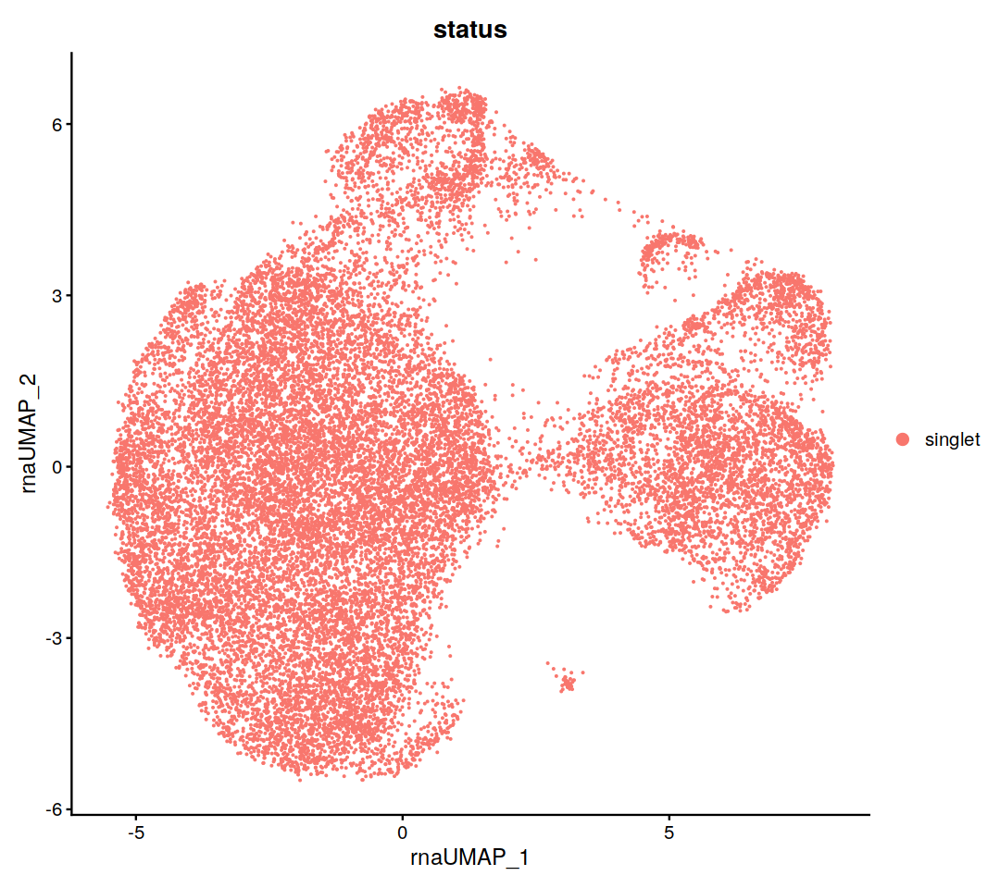

In [18]:
options(repr.plot.width=9, repr.plot.height=8)
DimPlot(seurat_combined, group.by='status')

# Differential expression

## Select perturbed/control cells
Find guide+ (perturbed) and guide- (unperturbed) cells for each guide

In [19]:
libraries = unique(seurat_combined$library)
seurat_libs = list()
for(i in seq_along(libraries)){ 
    lib = libraries[i]
    seurat_libs[[i]] = subset(seurat_combined, subset = library == lib)
}
names(seurat_libs) <- libraries

In [20]:
perturbed_cells_by_guide = list()

for(i in 1:nrow(df_thresholds)){  
    perturbed_cells_in_all_libs = list()
    guide = df_thresholds$guide[i]
    # Loop over libraries
    for(lib in libraries){        
        seurat_lib = seurat_libs[[lib]]
        threshold = df_thresholds[i, lib]        
        #cat(blue(guide, lib, threshold, "\n"))
        cells_in_lib = Cells(seurat_lib)        
        sgrna_counts = seurat_lib[['sgRNA']]@counts
        select_perturbed = sgrna_counts[guide, cells_in_lib] >= threshold
        perturbed_cells_in_library = cells_in_lib[select_perturbed]
        #cat(length(cells_in_lib), "in", lib, guide, length(perturbed_cells_in_library), "cells >", threshold, "\n")        
        if(!is.na(threshold)) {
            perturbed_cells_in_all_libs = append(perturbed_cells_in_all_libs, perturbed_cells_in_library)
        }
    }
    perturbed_cells_by_guide[[i]] = perturbed_cells_in_all_libs
}
names(perturbed_cells_by_guide) <- df_thresholds$guide

In [21]:
length(perturbed_cells_by_guide[[3]])

[1] 948

In [22]:
df_thresholds$guide[grepl("NT" , df_thresholds$guide)]

[1] "NTCE1-1a" "NTCE3-1a" "NTCE3-1b" "NTCE4-1a" "NTCE4-1b"

## Helper functions (Just source helper_functions_for_diffex.r instead)

Mark cells that are positive for given guides as guide_positive, all others as guide_negative

In [23]:
mark_guide_pos_neg <- function(seurat_obj, perturbed_cells_by_guide, guides, print_counts = T) {
    all_cells = Cells(seurat_obj)
    perturbed_cells = c()
    dummy_perturbed = c()
    
    for(guide in guides) {
        dummy_perturbed = unlist(perturbed_cells_by_guide[[guide]])
        perturbed_cells = union(perturbed_cells, dummy_perturbed)    
        #cat(guide," ", length(perturbed_cells), "\n")
    }

    unperturbed_cells = unlist(setdiff(all_cells, perturbed_cells))
    Idents(seurat_obj) <- "guide_negative"
    seurat_obj <- SetIdent(seurat_obj, cells = perturbed_cells, value = "guide_positive") 

    if(print_counts) {
        n_gplus   = length(perturbed_cells)
        n_gminus = length(unperturbed_cells)    
        cat(blue("Guide+ =",n_gplus, "; Guide- =", n_gminus, "\n"))
    }
    
    seurat_obj
}

Mark cells that are positive for given guides as 'guide_positive', unperturbed as 'unperturbed', all others as 'guide_negative'. The 'unperturbed' are the cells with either no guides at all or only positive for non-targeting guides. I wanted use them as a gold-standard set of controls, but their number is pretty low. 

In [24]:
mark_pert_unpert <- function(seurat_obj, perturbed_cells_by_guide, df_guides, guides, print_counts = F) {
    guide_classes = unique(filter(df_guide, guide1 %in% guides | guide2 %in% guides)$class)
    if('nt_ctrl' %in% guide_classes) {
        stop("You can't pass non-targeting guides to mark_pert_unpert()")
    }
    select_targeting_guides = df_guides$class == 'targeting'
    df_targeting  = df_guides[select_targeting_guides, ]
    targeting_guides = c(df_targeting$guide1, df_targeting$guide2)
    seurat_dummy <- mark_guide_pos_neg(seurat_obj, perturbed_cells_by_guide, targeting_guides, print_counts = F)
    unperturbed_cells <- Cells(subset(seurat_dummy, idents='guide_negative'))
    
    seurat_dummy <- mark_guide_pos_neg(seurat_obj, perturbed_cells_by_guide, guides, print_counts = F)
    seurat_dummy <- SetIdent(seurat_dummy, cells = unperturbed_cells, value = "unperturbed")
    if(print_counts) {
        n_unpert = length(Cells(subset(seurat_dummy, idents='unperturbed')))
        n_pert = length(Cells(subset(seurat_dummy, idents='guide_positive')))
        cat(blue("Guide+ =",n_pert, "; Unperturbed =", n_unpert, "\n"))
    }
    seurat_dummy
}

Mark two different set of guides, A and B

In [25]:
mark_a_b <- function(seurat_obj, arg_perturbed_cells_by_guide, guides_a, guides_b) {
    all_cells = Cells(seurat_obj)
    a_cells = c()
    b_cells = c()
    dummy = c()
    
    Idents(seurat_obj) <- ""
    for(guide in guides_a) {
        dummy = unlist(arg_perturbed_cells_by_guide[[guide]])
        a_cells = union(a_cells, dummy)
    }

    dummy = c() 
    for(guide in guides_b) {
        dummy = unlist(arg_perturbed_cells_by_guide[[guide]])
        b_cells = union(b_cells, dummy)
    }

    # Discard overlapping cells
    overlapping_cells = intersect(a_cells, b_cells)
    a_cells = setdiff(a_cells, overlapping_cells)
    b_cells = setdiff(b_cells, overlapping_cells)
    
    n_a = length(a_cells)
    n_b = length(b_cells)
    cat(blue("A =", n_a, "; B =", n_b, "\n"))
    
    seurat_obj <- SetIdent(seurat_obj, cells = a_cells, value = "A") 
    seurat_obj <- SetIdent(seurat_obj, cells = b_cells, value = "B") 
    seurat_obj
}

Find guides that belong to a class/subclass

In [26]:
get_guides_by_subclass <- function(df_guides, column, value) {
    # column variable can be either 'class' or 'subclass'
    select_subclass = df_guides[, column] == value
    df_subclass     = df_guides[select_subclass, ]
    subclass_guides = c(df_subclass$guide1, df_subclass$guide2)
    subclass_guides    
}

Produce Vlnplot for given targets

In [27]:
vlnplot_for_targets <- function(seurat_obj, df_guide, perturbed_cells_by_guide, targets) {
    plt_list = list()
    for(i in seq_along(targets)) {
        target = targets[i]
        print(target)
        guides = get_guides_by_subclass(df_guide, 'alias', target)
        seurat_rna <- mark_guide_pos_neg(
            seurat_obj, 
            perturbed_cells_by_guide, 
            guides, 
            print_counts = T
        )

        options(repr.plot.width=5, repr.plot.height=4)
        plt <- VlnPlot(
            object = seurat_rna,
            features =  target, 
            idents = NULL, 
            pt.size = 0., 
            sort = F, 
            ncol = 1,    
        ) + theme(legend.position = 'none')
        plt_list[[i]] = plt
    }
    plt_list
}

Produce RidgePlot for given targets

In [28]:
ridgeplot_for_targets <- function(seurat_obj, df_guide, perturbed_cells_by_guide, targets) {
    plt_list = list()
    for(i in seq_along(targets)) {
        target = targets[i]
        print(target)
        guides = get_guides_by_subclass(df_guide, 'alias', target)
        seurat_rna <- mark_guide_pos_neg(
            seurat_obj, 
            perturbed_cells_by_guide, 
            guides, 
            print_counts = T
        )

        options(repr.plot.width=20, repr.plot.height=4)
        plt <- RidgePlot(
            object = seurat_rna,
            features =  targets, 
            idents = NULL,             
            sort = F, 
            ncol = length(targets),    
        ) + + theme(legend.position = 'none')
        plt_list[[i]] = plt
    }
    plt_list
}

### Applications

Find all unperturbed cells: these are the cells with either no guides or only NT guides

In [29]:
select_targeting_guides = df_guide$class == 'targeting'
df_targeting  = df_guide[select_targeting_guides, ]
targeting_guides = c(df_targeting$guide1, df_targeting$guide2)
seurat_rna <- mark_guide_pos_neg(seurat_rna, perturbed_cells_by_guide, targeting_guides)
unperturbed_cells <- Cells(subset(seurat_rna, idents='guide_negative'))

Guide+ = 20092 ; Guide- = 1271 


# Compare NTCE to GDOC to CCCE

In [30]:
guides_ntce = get_guides_by_subclass(df_guide, 'subclass', 'ntce')
guides_gdoc = get_guides_by_subclass(df_guide, 'subclass', 'gdoc')
guides_ccce = get_guides_by_subclass(df_guide, 'subclass', 'ccce')

### NTCE vs GDOC

In [31]:
seurat_rna <- mark_a_b(seurat_rna, perturbed_cells_by_guide, guides_ntce, guides_gdoc)

markers <- FindMarkers(
    object = seurat_rna,
    slot = "data",
    ident.1 = 'A',
    ident.2 = 'B',
    test.use = "MAST",
    latent.vars = c('library', 'donor'),
    verbose = F
)

markers

A = 3764 ; B = 2630 


Warning message in FindMarkers.default(object = data.use, slot = data.slot, counts = counts, :
"No features pass logfc.threshold threshold; returning empty data.frame"


avg_log2FC,pct.1,pct.2
<dbl>,<dbl>,<dbl>


### NTCE vs CCCE

In [32]:
seurat_rna <- mark_a_b(seurat_rna, perturbed_cells_by_guide, guides_ntce, guides_ccce)

markers <- FindMarkers(
    object = seurat_rna,
    slot = "data",
    ident.1 = 'A',
    ident.2 = 'B',
    test.use = "MAST",
    latent.vars = c('library', 'donor'),
    verbose = F
)

markers

A = 3751 ; B = 2625 


Warning message in FindMarkers.default(object = data.use, slot = data.slot, counts = counts, :
"No features pass logfc.threshold threshold; returning empty data.frame"


avg_log2FC,pct.1,pct.2
<dbl>,<dbl>,<dbl>


### GDOC vs CCCE

In [33]:
seurat_rna <- mark_a_b(seurat_rna, perturbed_cells_by_guide, guides_gdoc, guides_ccce)

markers <- FindMarkers(
    object = seurat_rna,
    slot = "data",
    ident.1 = 'A',
    ident.2 = 'B',
    test.use = "MAST",
    latent.vars = c('library', 'donor'),
    verbose = F
)

markers

A = 2900 ; B = 2908 


Warning message in FindMarkers.default(object = data.use, slot = data.slot, counts = counts, :
"No features pass logfc.threshold threshold; returning empty data.frame"


avg_log2FC,pct.1,pct.2
<dbl>,<dbl>,<dbl>


### Result

No <font color='yellow'> differentially expressed genes </font> between three classes of controls

# Is it better to compare guide+ vs guide- OR guide+ vs unperturbed?

Normalize RNA counts by <font color='red'>NormalizeData</font>  before running FindMarkers

In [34]:
seurat_rna = CreateSeuratObject(seurat_combined[['RNA']])
seurat_rna <- NormalizeData(seurat_rna)
seurat_rna@meta.data <- seurat_combined@meta.data

Guide+ = 2340 ; Unperturbed = 1271 


Picking joint bandwidth of 0.0621



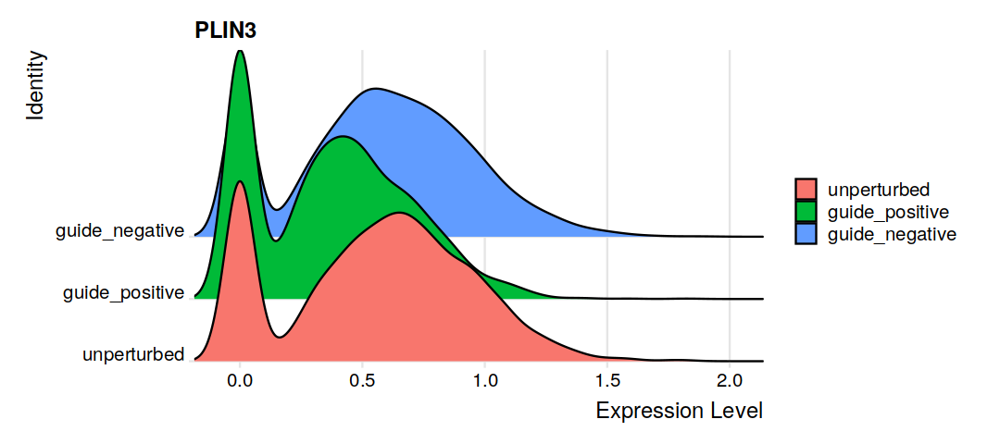


 Completed [===========>--------------------------------]  27% with 0 failures

 Completed [============>-------------------------------]  30% with 0 failures

 Completed [==============>-----------------------------]  33% with 0 failures

 Completed [===============>----------------------------]  36% with 0 failures

 Completed [================>---------------------------]  39% with 0 failures

 Completed [==================>-------------------------]  42% with 0 failures

 Completed [===================>------------------------]  45% with 0 failures

 Completed [====================>-----------------------]  48% with 0 failures

 Completed [======================>---------------------]  52% with 0 failures

 Completed [=======================>--------------------]  55% with 0 failures

 Completed [========================>-------------------]  58% with 0 failures

 Completed [==========================>-----------------]  61% with 0 failures

 Completed [===========================

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
PLIN3,1.5e-67,-0.28,0.71,0.79,5.6e-63
SQSTM1,5.4e-43,0.45,1.00,0.99,2.0e-38
SNHG16,1.1e-34,0.26,0.92,0.88,3.9e-30
PSAP,8.2e-32,0.32,0.99,0.98,3.0e-27
AL357507.1,7.6e-28,0.43,0.28,0.12,2.8e-23
HMOX1,2.6e-26,0.53,0.77,0.64,9.7e-22
MT-ATP8,1.1e-25,-0.25,0.99,1.00,4.1e-21
AL138828.1,1.3e-24,0.44,0.54,0.36,4.9e-20
HSP90B1,4.1e-24,-0.26,0.97,0.98,1.5e-19


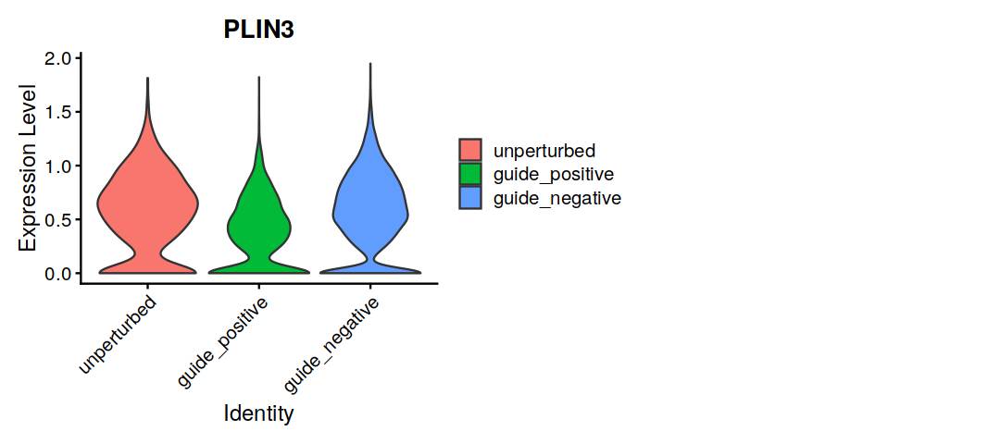

In [35]:
guides = c('PLIN3-1a', 'PLIN3-1b', 'PLIN3-2a', 'PLIN3-2b')
#seurat_rna <- mark_guide_pos_neg(seurat_rna, guides)
seurat_rna <- mark_pert_unpert(seurat_rna, perturbed_cells_by_guide, df_guide, guides, print_counts = T)


options(repr.plot.width=9, repr.plot.height=4)
RidgePlot(
    seurat_rna,    
    features = c('PLIN3'),
    sort = FALSE,
    ncol = 1
)

VlnPlot(
    object = seurat_rna,
    features =  c('PLIN3'), 
    idents = NULL, 
    pt.size = 0, 
    sort = F, 
    ncol = 2,    
) 


markers <- FindMarkers(
    object = seurat_rna,
    slot = "data",
    ident.1 = 'guide_positive',
    ident.2 = 'unperturbed',
    test.use = "MAST",
    latent.vars = c('library', 'donor'),
    verbose = F
)

markers

In [36]:
nrow(markers)

[1] 33

Guide+ = 2340 ; Guide- = 19023 


Picking joint bandwidth of 0.0525



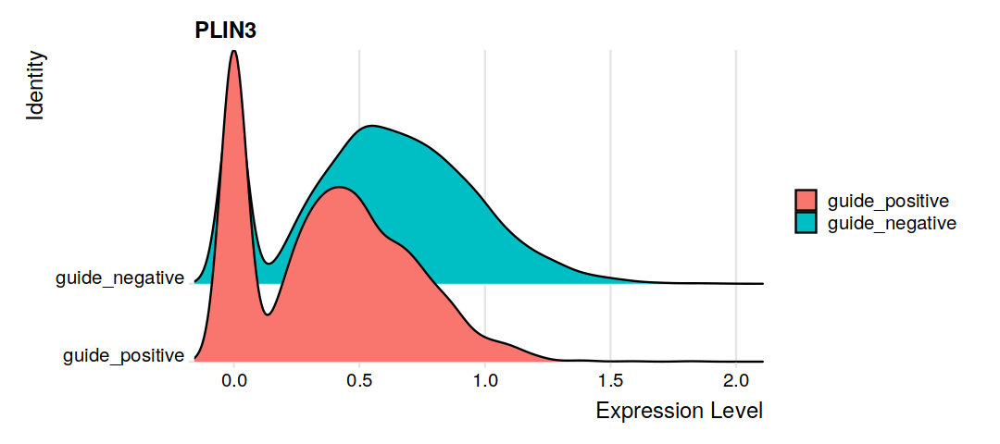


 Completed [============================================] 100% with 0 failures
                                                                              


Done!

Combining coefficients and standard errors

Calculating log-fold changes

Calculating likelihood ratio tests

Refitting on reduced model...


 Completed [============================================] 100% with 0 failures
                                                                              


Done!



,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
PLIN3,5.6e-140,-0.30,0.71,0.82,2.1e-135
HMOX1,2.7e-26,0.34,0.77,0.70,9.7e-22
AL138828.1,7.3e-22,0.29,0.54,0.44,2.7e-17


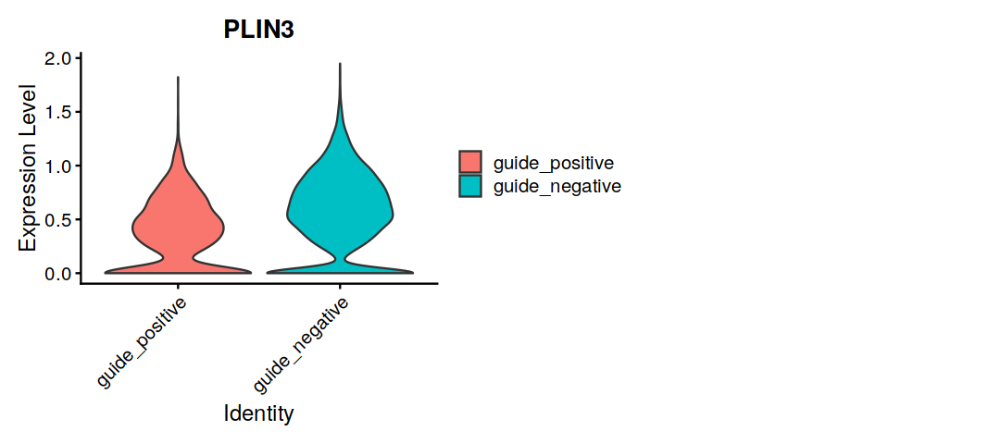

In [37]:
guides = c('PLIN3-1a', 'PLIN3-1b', 'PLIN3-2a', 'PLIN3-2b')
#seurat_rna <- mark_guide_pos_neg(seurat_rna, guides)
seurat_rna <- mark_guide_pos_neg(seurat_rna, perturbed_cells_by_guide, guides, print_counts = T)


options(repr.plot.width=9, repr.plot.height=4)
RidgePlot(
    seurat_rna,    
    features = c('PLIN3'),
    sort = FALSE,
    ncol = 1
)

VlnPlot(
    object = seurat_rna,
    features =  c('PLIN3'), 
    idents = NULL, 
    pt.size = 0, 
    sort = F, 
    ncol = 2,    
) 

markers <- FindMarkers(
    object = seurat_rna,
    slot = "data",
    ident.1 = 'guide_positive',
    ident.2 = 'guide_negative',
    test.use = "MAST",
    latent.vars = c('library', 'donor'),
    verbose = F
)

markers

### How many no-guide cells?

In [38]:
all_cells_w_a_guide = unique(unlist(perturbed_cells_by_guide))
all_cells = unique(Cells(seurat_rna))
no_guide_cells = setdiff(all_cells, all_cells_w_a_guide)

In [39]:
length(no_guide_cells)

[1] 116

### How many 'non-targeting only' cells?

# * * * DE for all Targeting Guides * * *

In [40]:
count_idents <- function(seurat_obj, idents) {
    length(Cells(subset(seurat_obj, idents = idents)))
}

In [41]:
targets = unique(filter(df_guide, class=='targeting')$alias)
#targets = unique(df_guide$alias)
df_de = NULL
genes_to_skip = c("DE5", "CD55", "CSTB")
genes_to_skip = c()
lfc_threshold = 0.15

for(target in targets){
    if(target %in% genes_to_skip){
        cat(red("Skipping", target, "\n"))
        next
    }
    guides_4_target = get_guides_by_subclass(df_guide, 'alias', target)
    cat(blue(target,":"), paste(guides_4_target, collapse=","),"\n")
    seurat_dummy <- mark_guide_pos_neg(seurat_rna, perturbed_cells_by_guide, guides_4_target, print_counts = T)
    
    markers <- FindMarkers(
        object = seurat_dummy,
        slot = "data",
        ident.1 = 'guide_positive',
        ident.2 = 'guide_negative',
        test.use = "MAST",
        latent.vars = c("library", "donor"),
        logfc.threshold = lfc_threshold,
        verbose = FALSE
    )
    # latent.vars = c('library') 
    if(nrow(markers)==0) {
        cat(Red("No DE genes", target,  "\n"))
    }
    markers$de_gene = rownames(markers)
    markers$target = target
    rownames(markers) <- NULL
    df_de = rbind(df_de, markers)
}

ANPEP : CD13-1a,CD13-1b 
Guide+ = 1378 ; Guide- = 19985 



 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [===>----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]  10% with 0 failures

 Completed [====>---------------------------------------]  11% with 0 failures

 Completed [====>---------------------------------------]  12% with 0 failures

 Completed [=====>--------------------------------------]  14% with 0 failures

 Completed [======>-------------------------------------]  15% with 0 failures

 Completed [======>-------------------------------------]  16% with 0 failures

 Completed [=======>------------------------------------]  18% with 0 failures

 Completed [=======>------------------------------------]  19% with 0 failures

 Completed [========>------------------

CD55 : CD55-1a,CD55-1b 
Guide+ = 1295 ; Guide- = 20068 



 Completed [===>----------------------------------------]   8% with 0 failures

 Completed [====>---------------------------------------]  11% with 0 failures

 Completed [=====>--------------------------------------]  14% with 0 failures

 Completed [======>-------------------------------------]  17% with 0 failures

 Completed [========>-----------------------------------]  19% with 0 failures

 Completed [=========>----------------------------------]  22% with 0 failures

 Completed [==========>---------------------------------]  25% with 0 failures

 Completed [===========>--------------------------------]  28% with 0 failures

 Completed [============>-------------------------------]  31% with 0 failures

 Completed [==============>-----------------------------]  33% with 0 failures

 Completed [===============>----------------------------]  36% with 0 failures

 Completed [================>---------------------------]  39% with 0 failures

 Completed [=================>---------

NT5E : CD73-1a,CD73-1b 
Guide+ = 1194 ; Guide- = 20169 



 Completed [====>---------------------------------------]  11% with 0 failures

 Completed [=====>--------------------------------------]  14% with 0 failures

 Completed [=======>------------------------------------]  18% with 0 failures

 Completed [========>-----------------------------------]  21% with 0 failures

 Completed [==========>---------------------------------]  25% with 0 failures

 Completed [============>-------------------------------]  29% with 0 failures

 Completed [=============>------------------------------]  32% with 0 failures

 Completed [===============>----------------------------]  36% with 0 failures

 Completed [================>---------------------------]  39% with 0 failures

 Completed [==================>-------------------------]  43% with 0 failures

 Completed [===================>------------------------]  46% with 0 failures

 Completed [=====================>----------------------]  50% with 0 failures

 Completed [=======================>---

FUBP1 : FUBP1-1a,FUBP1-1b 
Guide+ = 1049 ; Guide- = 20314 



 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]  10% with 0 failures

 Completed [====>---------------------------------------]  12% with 0 failures

 Completed [=====>--------------------------------------]  13% with 0 failures

 Completed [======>-------------------------------------]  15% with 0 failures

 Completed [=======>------------------------------------]  17% with 0 failures

 Completed [=======>------------------------------------]  19% with 0 failures

 Completed [========>-----------------------------------]  21% with 0 failures

 Completed [=========>----------------------------------]  23% with 0 failures

 Completed [==========>---------------------------------]  25% with 0 failures

 Completed [===========>--------------------------------]  27% with 0 failures

 Completed [============>--------------

C15orf40 : C15orf40-1a,C15orf40-1b 
Guide+ = 1278 ; Guide- = 20085 



 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [===>----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]  10% with 0 failures

 Completed [====>---------------------------------------]  12% with 0 failures

 Completed [=====>--------------------------------------]  14% with 0 failures

 Completed [======>-------------------------------------]  16% with 0 failures

 Completed [=======>------------------------------------]  18% with 0 failures

 Completed [========>-----------------------------------]  20% with 0 failures

 Completed [=========>----------------------------------]  22% with 0 failures

 Completed [==========>---------------------------------]  24% with 0 failures

 Completed [==========>---------------------------------]  26% with 0 failures

 Completed [===========>--------------------------------]  28% with 0 failures

 Completed [============>--------------

MAFF : MAFF-1a,MAFF-1b 
Guide+ = 1038 ; Guide- = 20325 



 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]  10% with 0 failures

 Completed [====>---------------------------------------]  11% with 0 failures

 Completed [=====>--------------------------------------]  13% with 0 failures

 Completed [=====>--------------------------------------]  14% with 0 failures

 Completed [======>-------------------------------------]  16% with 0 failures

 Completed [=======>------------------------------------]  17% with 0 failures

 Completed [=======>------------------------------------]  19% with 0 failures

 Completed [========>-----------------------------------]  21% with 0 failures

 Completed [=========>----------------------------------]  22% with 0 failures

 Completed [=========>-----------------

FTH1 : FTH1-1a,FTH1-2a,FTH1-1b,FTH1-2b 
Guide+ = 3962 ; Guide- = 17401 



 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [====>---------------------------------------]  10% with 0 failures

 Completed [=====>--------------------------------------]  13% with 0 failures

 Completed [======>-------------------------------------]  15% with 0 failures

 Completed [=======>------------------------------------]  18% with 0 failures

 Completed [========>-----------------------------------]  21% with 0 failures

 Completed [=========>----------------------------------]  23% with 0 failures

 Completed [==========>---------------------------------]  26% with 0 failures

 Completed [===========>--------------------------------]  28% with 0 failures

 Completed [=============>------------------------------]  31% with 0 failures

 Completed [==============>-----------------------------]  33% with 0 failures

 Completed [===============>----------------------------]  36% with 0 failures

 Completed [================>----------

PLIN3 : PLIN3-1a,PLIN3-2a,PLIN3-1b,PLIN3-2b 
Guide+ = 2340 ; Guide- = 19023 



 Completed [====>---------------------------------------]  12% with 0 failures

 Completed [======>-------------------------------------]  15% with 0 failures

 Completed [=======>------------------------------------]  19% with 0 failures

 Completed [=========>----------------------------------]  23% with 0 failures

 Completed [===========>--------------------------------]  27% with 0 failures

 Completed [=============>------------------------------]  31% with 0 failures

 Completed [==============>-----------------------------]  35% with 0 failures

 Completed [================>---------------------------]  38% with 0 failures

 Completed [==================>-------------------------]  42% with 0 failures

 Completed [===================>------------------------]  46% with 0 failures

 Completed [=====================>----------------------]  50% with 0 failures

 Completed [=======================>--------------------]  54% with 0 failures

 Completed [========================>--

TKT : TKT-1a,TKT-2a,TKT-1b,TKT-2b 
Guide+ = 2237 ; Guide- = 19126 



 Completed [====>---------------------------------------]  11% with 0 failures

 Completed [=====>--------------------------------------]  14% with 0 failures

 Completed [=======>------------------------------------]  18% with 0 failures

 Completed [========>-----------------------------------]  21% with 0 failures

 Completed [==========>---------------------------------]  25% with 0 failures

 Completed [============>-------------------------------]  29% with 0 failures

 Completed [=============>------------------------------]  32% with 0 failures

 Completed [===============>----------------------------]  36% with 0 failures

 Completed [================>---------------------------]  39% with 0 failures

 Completed [==================>-------------------------]  43% with 0 failures

 Completed [===================>------------------------]  46% with 0 failures

 Completed [=====================>----------------------]  50% with 0 failures

 Completed [=======================>---

LGALS3 : LGALS3-1a,LGALS3-2a,LGALS3-1b,LGALS3-2b 
Guide+ = 2449 ; Guide- = 18914 



 Completed [======>-------------------------------------]  17% with 0 failures

 Completed [=========>----------------------------------]  22% with 0 failures

 Completed [===========>--------------------------------]  28% with 0 failures

 Completed [==============>-----------------------------]  33% with 0 failures

 Completed [================>---------------------------]  39% with 0 failures

 Completed [===================>------------------------]  44% with 0 failures

 Completed [=====================>----------------------]  50% with 0 failures

 Completed [=======================>--------------------]  56% with 0 failures

 Completed [==========================>-----------------]  61% with 0 failures

 Completed [============================>---------------]  67% with 0 failures

 Completed [===============================>------------]  72% with 0 failures

 Completed [=================================>----------]  78% with 0 failures

 Completed [===========================

CSTB : CSTB-1a,CSTB-2a,CSTB-1b,CSTB-2b 
Guide+ = 2632 ; Guide- = 18731 



 Completed [===>----------------------------------------]  10% with 0 failures

 Completed [=====>--------------------------------------]  13% with 0 failures

 Completed [======>-------------------------------------]  17% with 0 failures

 Completed [========>-----------------------------------]  20% with 0 failures

 Completed [=========>----------------------------------]  23% with 0 failures

 Completed [===========>--------------------------------]  27% with 0 failures

 Completed [============>-------------------------------]  30% with 0 failures

 Completed [==============>-----------------------------]  33% with 0 failures

 Completed [===============>----------------------------]  37% with 0 failures

 Completed [=================>--------------------------]  40% with 0 failures

 Completed [==================>-------------------------]  43% with 0 failures

 Completed [====================>-----------------------]  47% with 0 failures

 Completed [=====================>-----

CTSB : CTSB-1a,CTSB-2a,CTSB-1b,CTSB-2b 
Guide+ = 2556 ; Guide- = 18807 



 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [===>----------------------------------------]  10% with 0 failures

 Completed [====>---------------------------------------]  12% with 0 failures

 Completed [=====>--------------------------------------]  15% with 0 failures

 Completed [=======>------------------------------------]  17% with 0 failures

 Completed [========>-----------------------------------]  20% with 0 failures

 Completed [=========>----------------------------------]  22% with 0 failures

 Completed [==========>---------------------------------]  24% with 0 failures

 Completed [===========>--------------------------------]  27% with 0 failures

 Completed [============>-------------------------------]  29% with 0 failures

 Completed [=============>------------------------------]  32% with 0 failures

 Completed [==============>-----------------------------]  34% with 0 failures

 Completed [===============>-----------

KLF6 : KLF6-1a,KLF6-2a,KLF6-1b,KLF6-2b 
Guide+ = 2549 ; Guide- = 18814 



 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [===>----------------------------------------]  10% with 0 failures

 Completed [====>---------------------------------------]  12% with 0 failures

 Completed [=====>--------------------------------------]  15% with 0 failures

 Completed [=======>------------------------------------]  17% with 0 failures

 Completed [========>-----------------------------------]  20% with 0 failures

 Completed [=========>----------------------------------]  22% with 0 failures

 Completed [==========>---------------------------------]  24% with 0 failures

 Completed [===========>--------------------------------]  27% with 0 failures

 Completed [============>-------------------------------]  29% with 0 failures

 Completed [=============>------------------------------]  32% with 0 failures

 Completed [==============>------------

DE1 : DE1-1a,DE1-2a,DE1-1b,DE1-2b 
Guide+ = 2543 ; Guide- = 18820 



 Completed [===>----------------------------------------]   9% with 0 failures

 Completed [====>---------------------------------------]  12% with 0 failures

 Completed [=====>--------------------------------------]  15% with 0 failures

 Completed [=======>------------------------------------]  18% with 0 failures

 Completed [========>-----------------------------------]  21% with 0 failures

 Completed [=========>----------------------------------]  24% with 0 failures

 Completed [===========>--------------------------------]  26% with 0 failures

 Completed [============>-------------------------------]  29% with 0 failures

 Completed [=============>------------------------------]  32% with 0 failures

 Completed [===============>----------------------------]  35% with 0 failures

 Completed [================>---------------------------]  38% with 0 failures

 Completed [=================>--------------------------]  41% with 0 failures

 Completed [==================>--------

DE2 : DE2-1a,DE2-2a,DE2-1b,DE2-2b 
Guide+ = 1413 ; Guide- = 19950 



 Completed [====>---------------------------------------]  11% with 0 failures

 Completed [=====>--------------------------------------]  14% with 0 failures

 Completed [=======>------------------------------------]  18% with 0 failures

 Completed [========>-----------------------------------]  21% with 0 failures

 Completed [==========>---------------------------------]  25% with 0 failures

 Completed [============>-------------------------------]  29% with 0 failures

 Completed [=============>------------------------------]  32% with 0 failures

 Completed [===============>----------------------------]  36% with 0 failures

 Completed [================>---------------------------]  39% with 0 failures

 Completed [==================>-------------------------]  43% with 0 failures

 Completed [===================>------------------------]  46% with 0 failures

 Completed [=====================>----------------------]  50% with 0 failures

 Completed [=======================>---

DE3 : DE3-1a,DE3-2a,DE3-1b,DE3-2b 
Guide+ = 2745 ; Guide- = 18618 



 Completed [===>----------------------------------------]   9% with 0 failures

 Completed [====>---------------------------------------]  12% with 0 failures

 Completed [======>-------------------------------------]  15% with 0 failures

 Completed [=======>------------------------------------]  18% with 0 failures

 Completed [========>-----------------------------------]  21% with 0 failures

 Completed [==========>---------------------------------]  24% with 0 failures

 Completed [===========>--------------------------------]  27% with 0 failures

 Completed [============>-------------------------------]  30% with 0 failures

 Completed [==============>-----------------------------]  33% with 0 failures

 Completed [===============>----------------------------]  36% with 0 failures

 Completed [================>---------------------------]  39% with 0 failures

 Completed [==================>-------------------------]  42% with 0 failures

 Completed [===================>-------

DE4 : DE4-1a,DE4-2a,DE4-1b,DE4-2b 
Guide+ = 2900 ; Guide- = 18463 



 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]  10% with 0 failures

 Completed [====>---------------------------------------]  12% with 0 failures

 Completed [=====>--------------------------------------]  13% with 0 failures

 Completed [======>-------------------------------------]  15% with 0 failures

 Completed [=======>------------------------------------]  17% with 0 failures

 Completed [=======>------------------------------------]  19% with 0 failures

 Completed [========>-----------------------------------]  21% with 0 failures

 Completed [=========>----------------------------------]  23% with 0 failures

 Completed [==========>---------------------------------]  25% with 0 failures

 Completed [===========>--------------------------------]  27% with 0 failures

 Completed [============>--------------

DE5 : DE5-1a,DE5-2a,DE5-1b,DE5-2b 
Guide+ = 2805 ; Guide- = 18558 



 Completed [===>----------------------------------------]   9% with 0 failures

 Completed [=====>--------------------------------------]  14% with 0 failures

 Completed [=======>------------------------------------]  18% with 0 failures

 Completed [=========>----------------------------------]  23% with 0 failures

 Completed [===========>--------------------------------]  27% with 0 failures

 Completed [=============>------------------------------]  32% with 0 failures

 Completed [===============>----------------------------]  36% with 0 failures

 Completed [=================>--------------------------]  41% with 0 failures

 Completed [===================>------------------------]  45% with 0 failures

 Completed [=====================>----------------------]  50% with 0 failures

 Completed [=======================>--------------------]  55% with 0 failures

 Completed [=========================>------------------]  59% with 0 failures

 Completed [===========================

DE6 : DE6-1a,DE6-2a,DE6-1b,DE6-2b 
Guide+ = 3211 ; Guide- = 18152 



 Completed [====>---------------------------------------]  11% with 0 failures

 Completed [======>-------------------------------------]  15% with 0 failures

 Completed [=======>------------------------------------]  19% with 0 failures

 Completed [=========>----------------------------------]  22% with 0 failures

 Completed [==========>---------------------------------]  26% with 0 failures

 Completed [============>-------------------------------]  30% with 0 failures

 Completed [==============>-----------------------------]  33% with 0 failures

 Completed [===============>----------------------------]  37% with 0 failures

 Completed [=================>--------------------------]  41% with 0 failures

 Completed [===================>------------------------]  44% with 0 failures

 Completed [====================>-----------------------]  48% with 0 failures

 Completed [======================>---------------------]  52% with 0 failures

 Completed [=======================>---

DE7 : DE7-1a,DE7-2a,DE7-1b,DE7-2b 
Guide+ = 2626 ; Guide- = 18737 



 Completed [=====>--------------------------------------]  12% with 0 failures

 Completed [======>-------------------------------------]  17% with 0 failures

 Completed [========>-----------------------------------]  21% with 0 failures

 Completed [==========>---------------------------------]  25% with 0 failures

 Completed [============>-------------------------------]  29% with 0 failures

 Completed [==============>-----------------------------]  33% with 0 failures

 Completed [===============>----------------------------]  38% with 0 failures

 Completed [=================>--------------------------]  42% with 0 failures

 Completed [===================>------------------------]  46% with 0 failures

 Completed [=====================>----------------------]  50% with 0 failures

 Completed [=======================>--------------------]  54% with 0 failures

 Completed [=========================>------------------]  58% with 0 failures

 Completed [===========================

DE8 : DE8-1a,DE8-2a,DE8-1b,DE8-2b 
Guide+ = 3059 ; Guide- = 18304 



 Completed [===>----------------------------------------]  10% with 0 failures

 Completed [=====>--------------------------------------]  13% with 0 failures

 Completed [======>-------------------------------------]  17% with 0 failures

 Completed [========>-----------------------------------]  20% with 0 failures

 Completed [=========>----------------------------------]  23% with 0 failures

 Completed [===========>--------------------------------]  27% with 0 failures

 Completed [============>-------------------------------]  30% with 0 failures

 Completed [==============>-----------------------------]  33% with 0 failures

 Completed [===============>----------------------------]  37% with 0 failures

 Completed [=================>--------------------------]  40% with 0 failures

 Completed [==================>-------------------------]  43% with 0 failures

 Completed [====================>-----------------------]  47% with 0 failures

 Completed [=====================>-----

DE9 : DE9-1a,DE9-2a,DE9-1b,DE9-2b 
Guide+ = 1526 ; Guide- = 19837 



 Completed [===>----------------------------------------]   9% with 0 failures

 Completed [====>---------------------------------------]  11% with 0 failures

 Completed [=====>--------------------------------------]  14% with 0 failures

 Completed [=======>------------------------------------]  17% with 0 failures

 Completed [========>-----------------------------------]  20% with 0 failures

 Completed [=========>----------------------------------]  23% with 0 failures

 Completed [==========>---------------------------------]  26% with 0 failures

 Completed [============>-------------------------------]  29% with 0 failures

 Completed [=============>------------------------------]  31% with 0 failures

 Completed [==============>-----------------------------]  34% with 0 failures

 Completed [===============>----------------------------]  37% with 0 failures

 Completed [=================>--------------------------]  40% with 0 failures

 Completed [==================>--------

DE10 : DE10-1a,DE10-2a,DE10-1b,DE10-2b 
Guide+ = 2219 ; Guide- = 19144 



 Completed [====>---------------------------------------]  12% with 0 failures

 Completed [======>-------------------------------------]  15% with 0 failures

 Completed [=======>------------------------------------]  19% with 0 failures

 Completed [=========>----------------------------------]  23% with 0 failures

 Completed [===========>--------------------------------]  27% with 0 failures

 Completed [=============>------------------------------]  31% with 0 failures

 Completed [==============>-----------------------------]  35% with 0 failures

 Completed [================>---------------------------]  38% with 0 failures

 Completed [==================>-------------------------]  42% with 0 failures

 Completed [===================>------------------------]  46% with 0 failures

 Completed [=====================>----------------------]  50% with 0 failures

 Completed [=======================>--------------------]  54% with 0 failures

 Completed [========================>--

DE11 : DE11-1a,DE11-2a,DE11-1b,DE11-2b 
Guide+ = 2552 ; Guide- = 18811 



 Completed [====>---------------------------------------]  12% with 0 failures

 Completed [======>-------------------------------------]  16% with 0 failures

 Completed [========>-----------------------------------]  20% with 0 failures

 Completed [==========>---------------------------------]  24% with 0 failures

 Completed [===========>--------------------------------]  28% with 0 failures

 Completed [=============>------------------------------]  32% with 0 failures

 Completed [===============>----------------------------]  36% with 0 failures

 Completed [=================>--------------------------]  40% with 0 failures

 Completed [==================>-------------------------]  44% with 0 failures

 Completed [====================>-----------------------]  48% with 0 failures

 Completed [======================>---------------------]  52% with 0 failures

 Completed [========================>-------------------]  56% with 0 failures

 Completed [=========================>-

DE12 : DE12-1a,DE12-2a,DE12-1b,DE12-2b 
Guide+ = 2408 ; Guide- = 18955 



 Completed [===>----------------------------------------]  10% with 0 failures

 Completed [=====>--------------------------------------]  13% with 0 failures

 Completed [======>-------------------------------------]  17% with 0 failures

 Completed [========>-----------------------------------]  20% with 0 failures

 Completed [=========>----------------------------------]  23% with 0 failures

 Completed [===========>--------------------------------]  27% with 0 failures

 Completed [============>-------------------------------]  30% with 0 failures

 Completed [==============>-----------------------------]  33% with 0 failures

 Completed [===============>----------------------------]  37% with 0 failures

 Completed [=================>--------------------------]  40% with 0 failures

 Completed [==================>-------------------------]  43% with 0 failures

 Completed [====================>-----------------------]  47% with 0 failures

 Completed [=====================>-----

DE13 : DE13-1a,DE13-2a,DE13-1b,DE13-2b 
Guide+ = 1897 ; Guide- = 19466 



 Completed [====>---------------------------------------]  10% with 0 failures

 Completed [=====>--------------------------------------]  14% with 0 failures

 Completed [=======>------------------------------------]  17% with 0 failures

 Completed [========>-----------------------------------]  21% with 0 failures

 Completed [==========>---------------------------------]  24% with 0 failures

 Completed [===========>--------------------------------]  28% with 0 failures

 Completed [=============>------------------------------]  31% with 0 failures

 Completed [==============>-----------------------------]  34% with 0 failures

 Completed [================>---------------------------]  38% with 0 failures

 Completed [=================>--------------------------]  41% with 0 failures

 Completed [===================>------------------------]  45% with 0 failures

 Completed [====================>-----------------------]  48% with 0 failures

 Completed [======================>----

DE14 : DE14-1a,DE14-2a,DE14-1b,DE14-2b 
Guide+ = 2541 ; Guide- = 18822 



 Completed [====>---------------------------------------]  12% with 0 failures

 Completed [======>-------------------------------------]  16% with 0 failures

 Completed [========>-----------------------------------]  20% with 0 failures

 Completed [==========>---------------------------------]  24% with 0 failures

 Completed [===========>--------------------------------]  28% with 0 failures

 Completed [=============>------------------------------]  32% with 0 failures

 Completed [===============>----------------------------]  36% with 0 failures

 Completed [=================>--------------------------]  40% with 0 failures

 Completed [==================>-------------------------]  44% with 0 failures

 Completed [====================>-----------------------]  48% with 0 failures

 Completed [======================>---------------------]  52% with 0 failures

 Completed [========================>-------------------]  56% with 0 failures

 Completed [=========================>-

DE15 : DE15-1a,DE15-2a,DE15-1b,DE15-2b 
Guide+ = 2658 ; Guide- = 18705 



 Completed [===>----------------------------------------]   9% with 0 failures

 Completed [====>---------------------------------------]  12% with 0 failures

 Completed [======>-------------------------------------]  15% with 0 failures

 Completed [=======>------------------------------------]  18% with 0 failures

 Completed [========>-----------------------------------]  21% with 0 failures

 Completed [==========>---------------------------------]  24% with 0 failures

 Completed [===========>--------------------------------]  27% with 0 failures

 Completed [============>-------------------------------]  30% with 0 failures

 Completed [==============>-----------------------------]  33% with 0 failures

 Completed [===============>----------------------------]  36% with 0 failures

 Completed [================>---------------------------]  39% with 0 failures

 Completed [==================>-------------------------]  42% with 0 failures

 Completed [===================>-------

DE16 : DE16-1a,DE16-2a,DE16-1b,DE16-2b 
Guide+ = 2132 ; Guide- = 19231 



 Completed [====>---------------------------------------]  12% with 0 failures

 Completed [======>-------------------------------------]  16% with 0 failures

 Completed [========>-----------------------------------]  20% with 0 failures

 Completed [==========>---------------------------------]  24% with 0 failures

 Completed [===========>--------------------------------]  28% with 0 failures

 Completed [=============>------------------------------]  32% with 0 failures

 Completed [===============>----------------------------]  36% with 0 failures

 Completed [=================>--------------------------]  40% with 0 failures

 Completed [==================>-------------------------]  44% with 0 failures

 Completed [====================>-----------------------]  48% with 0 failures

 Completed [======================>---------------------]  52% with 0 failures

 Completed [========================>-------------------]  56% with 0 failures

 Completed [=========================>-

DE17 : DE17-1a,DE17-2a,DE17-1b,DE17-2b 
Guide+ = 2394 ; Guide- = 18969 



 Completed [===>----------------------------------------]   9% with 0 failures

 Completed [====>---------------------------------------]  12% with 0 failures

 Completed [======>-------------------------------------]  15% with 0 failures

 Completed [=======>------------------------------------]  18% with 0 failures

 Completed [========>-----------------------------------]  21% with 0 failures

 Completed [==========>---------------------------------]  24% with 0 failures

 Completed [===========>--------------------------------]  27% with 0 failures

 Completed [============>-------------------------------]  30% with 0 failures

 Completed [==============>-----------------------------]  33% with 0 failures

 Completed [===============>----------------------------]  36% with 0 failures

 Completed [================>---------------------------]  39% with 0 failures

 Completed [==================>-------------------------]  42% with 0 failures

 Completed [===================>-------

Write to file

In [42]:
lfc = gsub("\\.", "_", lfc_threshold)
de_f_name = paste0(secondary_a_path, "/integrated/DE_outputs/DE_genes_by_target_LFC_", lfc, "_UNFILTERED.tsv")
write.table(df_de, de_f_name, sep="\t", quote = F, row.names = F)

### Filter out spurious hits

In [43]:
# Some genes come up as differentially expressed all the time
# Filter those out, and write to another file
funky_de_genes = c("HMOX1", "AL357507.1", "IFI27", "AL138828.1", "SQSTM1", "PLCG2", "PLIN2", "SAA1", "RARRES2", "CDKN1A")
df_de = filter(df_de, !(de_gene  %in% funky_de_genes))

de_f_name = paste0(secondary_a_path, "/integrated/DE_outputs/DE_genes_by_target_LFC_", lfc, "_FILTERED.tsv")
write.table(df_de, de_f_name, sep="\t", quote = F, row.names = F)

# Inpect DE results

In [44]:
df_de = read.table(de_f_name, sep="\t",  header = T)

Print top high-confidence hits

In [45]:
df_de %>% filter(avg_log2FC < 0) %>% arrange(p_val_adj) %>% head(30)

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,de_gene,target
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
1,0.0e+00,-0.57,1.00,1.00,0.0e+00,FTH1,FTH1
2,5.3e-202,-0.71,0.84,0.92,1.9e-197,LGALS3,LGALS3
3,3.1e-199,-0.58,0.46,0.82,1.1e-194,NT5E,NT5E
4,8.8e-177,-0.46,0.95,0.98,3.2e-172,TKT,TKT
5,9.1e-162,-0.60,0.96,0.97,3.3e-157,CTSB,CTSB
6,1.1e-155,-0.32,0.29,0.63,4.0e-151,C15orf40,C15orf40
7,6.7e-140,-0.30,0.71,0.82,2.5e-135,PLIN3,PLIN3
8,9.5e-114,-0.51,0.57,0.80,3.5e-109,ANPEP,ANPEP
9,4.3e-102,-0.31,0.57,0.71,1.6e-97,NDRG1,DE6


In [46]:
targets = unique(df_de$target)

for(t in targets){
    print(filter(df_de, target == t) %>% head(1))
    #cat(yellow("------------------------------------------------------------\n\n\n"))

}

     p_val avg_log2FC pct.1 pct.2 p_val_adj de_gene target
1 9.5e-114      -0.51  0.57   0.8  3.5e-109   ANPEP  ANPEP
    p_val avg_log2FC pct.1 pct.2 p_val_adj de_gene target
1 1.3e-86      -0.19  0.16   0.4   4.8e-82    CD55   CD55
     p_val avg_log2FC pct.1 pct.2 p_val_adj de_gene target
1 3.1e-199      -0.58  0.46  0.82  1.1e-194    NT5E   NT5E
    p_val avg_log2FC pct.1 pct.2 p_val_adj de_gene target
1 6.2e-48      -0.23  0.54  0.69   2.3e-43   FUBP1  FUBP1
     p_val avg_log2FC pct.1 pct.2 p_val_adj  de_gene   target
1 1.1e-155      -0.32  0.29  0.63    4e-151 C15orf40 C15orf40
    p_val avg_log2FC pct.1 pct.2 p_val_adj de_gene target
1 6.7e-31      -0.23  0.64  0.72   2.4e-26   PTPN3   MAFF
  p_val avg_log2FC pct.1 pct.2 p_val_adj de_gene target
1     0      -0.57     1     1         0    FTH1   FTH1
     p_val avg_log2FC pct.1 pct.2 p_val_adj de_gene target
1 6.7e-140       -0.3  0.71  0.82  2.5e-135   PLIN3  PLIN3
     p_val avg_log2FC pct.1 pct.2 p_val_adj de_gene target
1 8

# Inspect DE between clusters

## Are HMOX1, SQSTM1 etc localized to a cluster? No

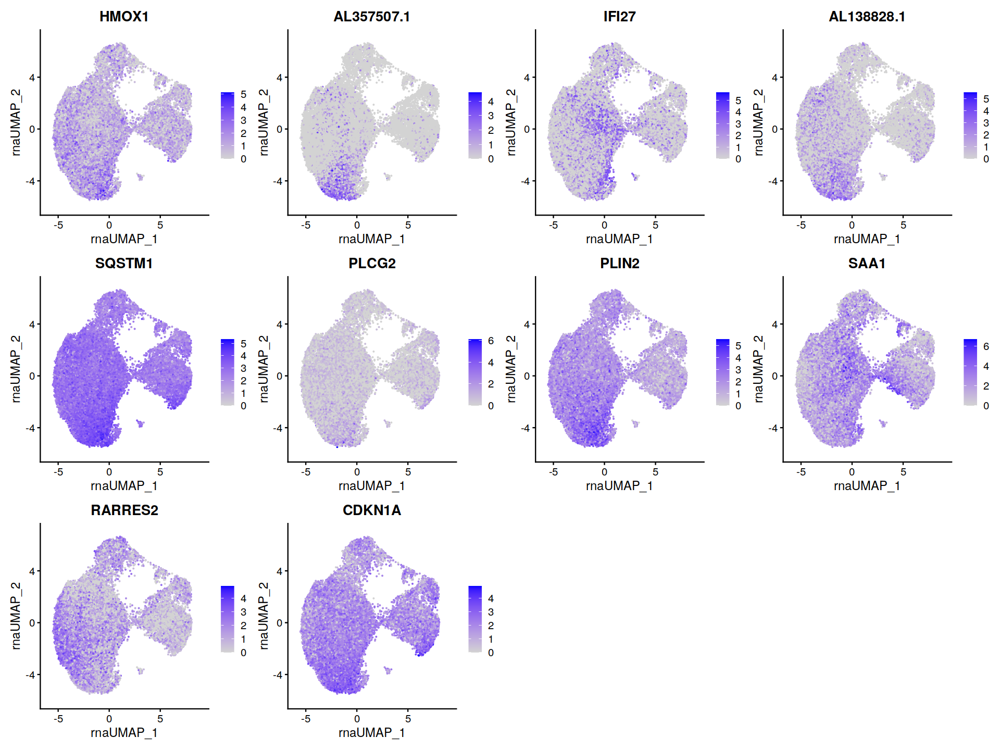

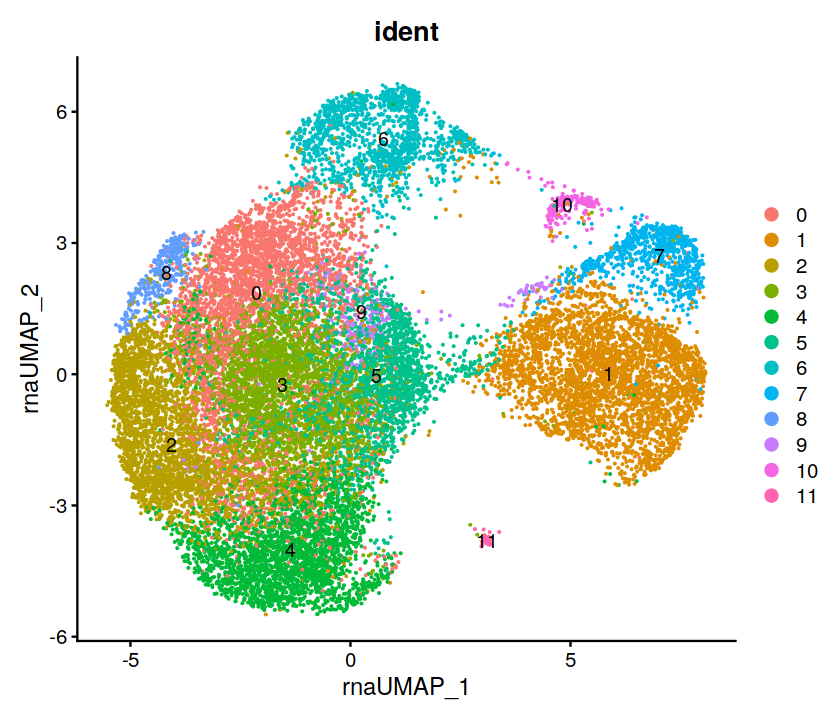

In [47]:
funky_de_genes = c("HMOX1", "AL357507.1", "IFI27", "AL138828.1", "SQSTM1", "PLCG2", "PLIN2", "SAA1", "RARRES2", "CDKN1A")
options(repr.plot.width = 16, repr.plot.height = 12)
FeaturePlot(seurat_combined, features = funky_de_genes, ncol=4)
options(repr.plot.width=7, repr.plot.height=6)    
DimPlot(seurat_combined, label=T, group.by='ident')

# Compare Cluster 1 to 4

In [48]:
seurat_dummy = NormalizeData(seurat_combined)

In [84]:
Idents(seurat_dummy) <- seurat_dummy$seurat_clusters

markers <- FindMarkers(
        object = seurat_combined,
        assay = 'RNA',
        slot = "data",
        ident.1 = 1,
        ident.2 = 4,
        test.use = "MAST",
        logfc.threshold = 2,
        latent.vars = c('library', 'donor'),
        verbose = F
    )


 Completed [--------------------------------------------]   0% with 0 failures

 Completed [--------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [=>------------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>-----------------------

# Plot upregulated

In [85]:
cluster_de_genes <- rownames(filter(markers, (p_val_adj < 1e-80) & (avg_log2FC > 2))) %>% head(50)
cat(cluster_de_genes, "\n")

AP1S3 BST2 C5orf38 CD24 CD9 CHST9 COBLL1 COL8A1 CRNDE CYS1 DCN DEFB1 DENND2A EMP1 ERBB4 FAM155A FCGRT FOXC1 FXYD2 GPNMB GSN HLA-DMB HOXB-AS3 HOXB3 IFITM2 IGFBP2 IRX2 IRX3 KCNIP4 KRT19 LDHB LINC01116 LINC02532 MAL MECOM MMP7 PANTR1 PDE1A PDLIM4 PRKCQ SCIN SEC14L1 SFRP1 SGIP1 SIM1 SIM2 SKAP1 SLPI SNED1 STMN1 


In [86]:
markers %>% arrange(p_val_adj) %>% filter(avg_log2FC > 5) %>% head(50) %>% rownames()

[1] "AP1S3"     "BST2"      "CD24"      "CD9"       "CHST9"     "COBLL1"   
 [7] "COL8A1"    "CRNDE"     "CYS1"      "DCN"       "DEFB1"     "DENND2A"  
[13] "EMP1"      "ERBB4"     "FAM155A"   "FCGRT"     "FOXC1"     "FXYD2"    
[19] "GPNMB"     "GSN"       "HLA-DMB"   "HOXB-AS3"  "IFITM2"    "IGFBP2"   
[25] "IRX2"      "IRX3"      "KCNIP4"    "KRT19"     "LDHB"      "LINC01116"
[31] "LINC02532" "MAL"       "MECOM"     "MMP7"      "PANTR1"    "PDE1A"    
[37] "PDLIM4"    "PRKCQ"     "SCIN"      "SEC14L1"   "SFRP1"     "SGIP1"    
[43] "SIM1"      "SIM2"      "SKAP1"     "SLPI"      "SNED1"     "STMN1"    
[49] "TCIM"      "TFAP2B"

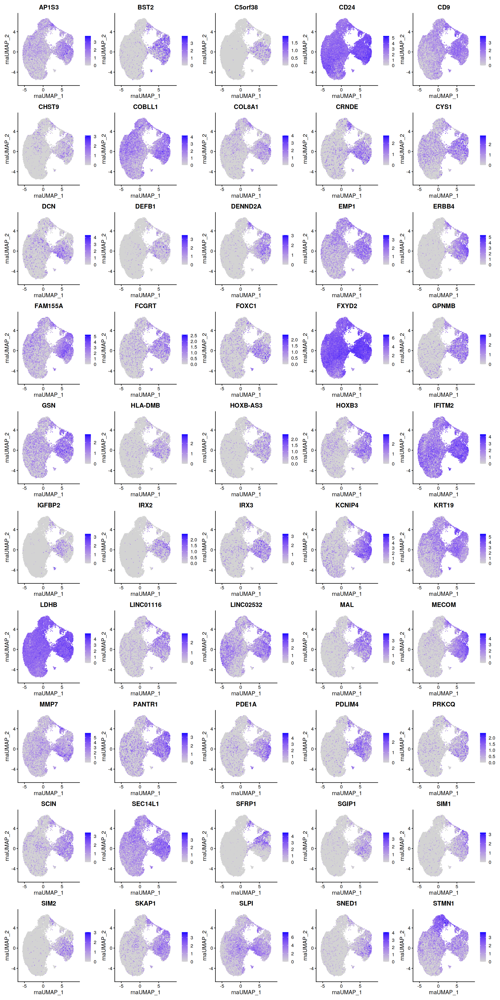

In [87]:
options(repr.plot.width=18, repr.plot.height=36)
FeaturePlot(seurat_combined, features = cluster_de_genes, ncol=5)

In [88]:
sample_n(markers, 20)

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
NEBL,6.6e-43,-55.3,0.16,0.29,2.4e-38
KIAA1549,8.6e-04,-11.0,0.20,0.17,1.0e+00
MORF4L1,3.0e-22,2.6,0.98,0.95,1.1e-17
DBI,4.2e-177,71.8,0.99,0.94,1.5e-172
EIF4H,6.5e-06,4.2,0.72,0.70,2.4e-01
AC108519.1,6.6e-02,-5.7,0.26,0.24,1.0e+00
GSTCD,4.1e-10,80.4,0.55,0.48,1.5e-05
TNIP2,7.5e-06,-3.6,0.47,0.50,2.8e-01
LGALS1,5.7e-103,55.9,0.97,0.95,2.1e-98


# Plot downregulated

AL138828.1 AL357507.1 IGFBP4 ITPKA L3MBTL4 LGALS3 MGST1 MSC-AS1 NUPR1 OLAH PLIN2 SPON1 TRIB3 SCHLAP1 SPTLC3 DDIT3 DIAPH3 ABLIM3 CPNE7 LRMDA CEBPB AFF3 DCDC2 SLC7A7 AP003400.1 SESN2 RBCK1 SOD2 PTPRD ABCA1 DPEP1 SQSTM1 PTK7 CDH2 ZIM3 AC138305.1 ZEB2 FNIP2 PNRC1 CDH3 CLGN BCAT1 GMDS RNF187 IARS MKNK2 AL591043.2 IL32 DNAJC12 MYLK 


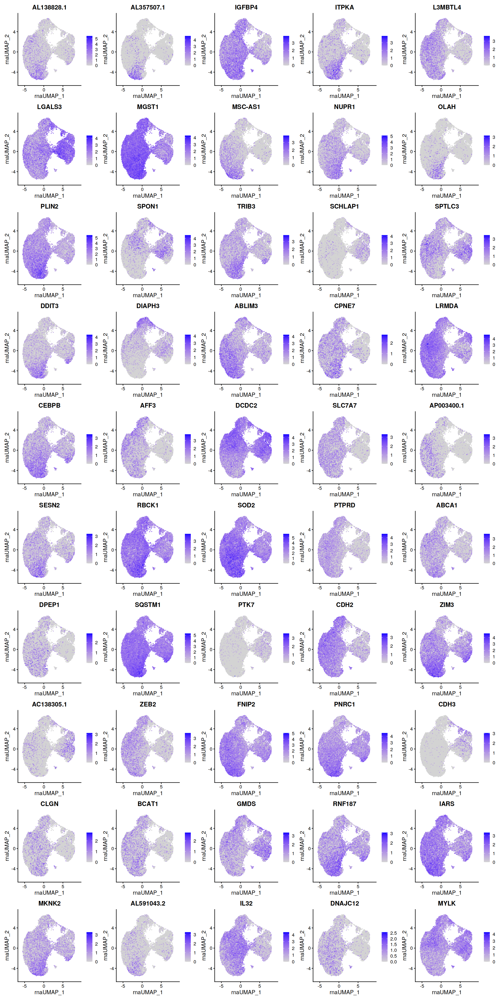

In [89]:
cluster_de_genes <- rownames(filter(markers, (p_val_adj < 1e-40) & (avg_log2FC < -4))) %>% head(50)
cat(cluster_de_genes, "\n")
options(repr.plot.width=18, repr.plot.height=36)
FeaturePlot(seurat_combined, features = cluster_de_genes, ncol=5)

## Plot all controls

In [90]:
all_controls = unique(filter(df_guide, subclass == "tss" | subclass == 'de_control')$alias)

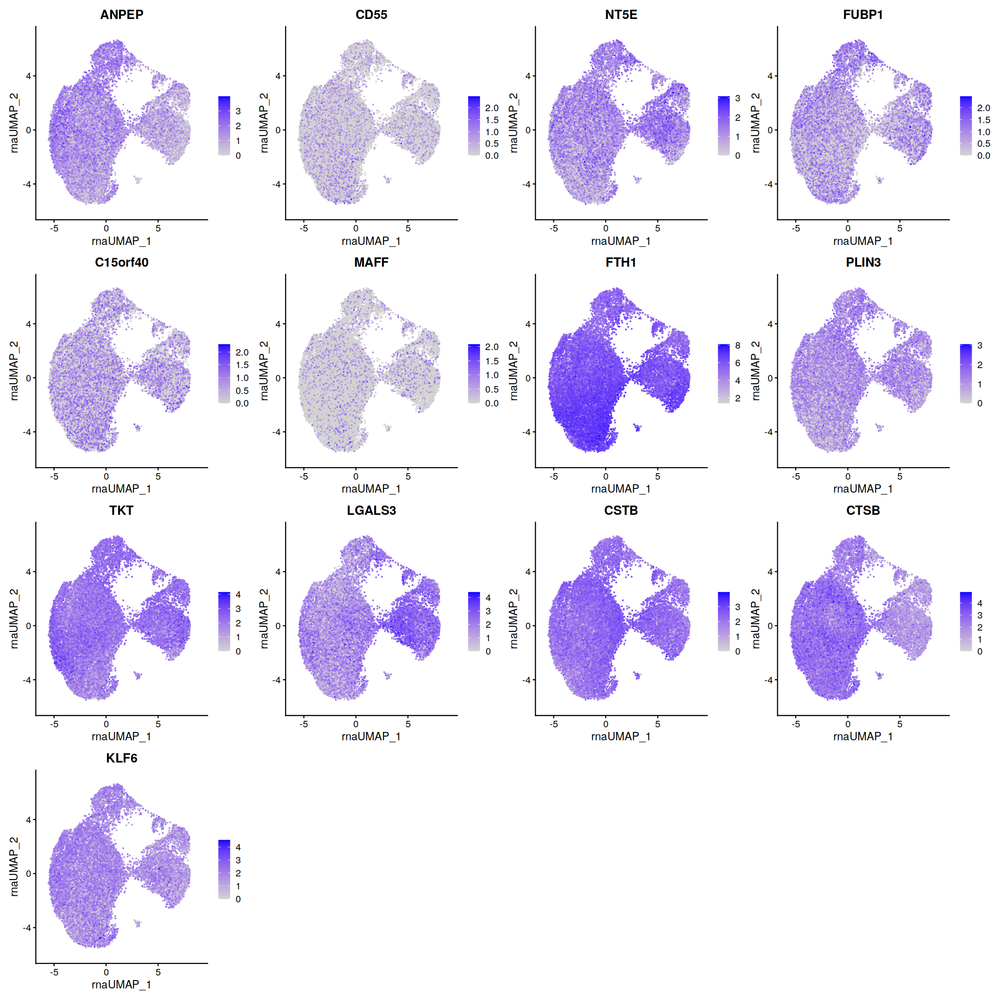

In [91]:
options(repr.plot.width=18, repr.plot.height=18)
FeaturePlot(seurat_combined, features = all_controls, ncol=4)

# Visualize Knockdowns

## Spurious hits

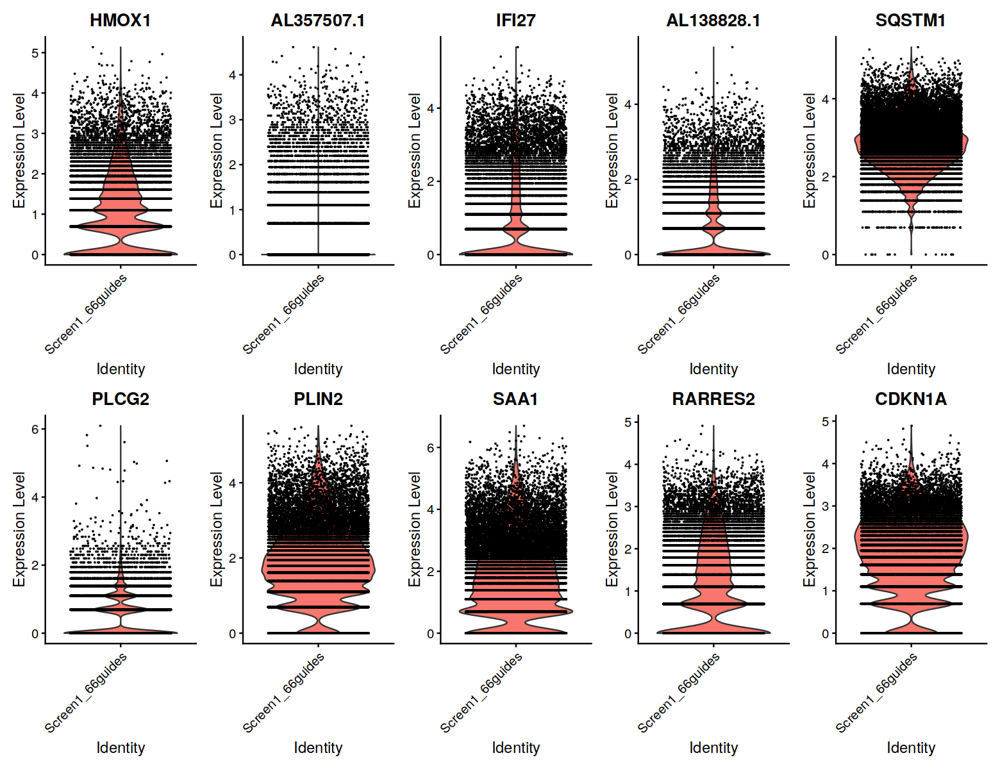

In [57]:
funky_de_genes = c("HMOX1", "AL357507.1", "IFI27", "AL138828.1", "SQSTM1", "PLCG2", "PLIN2", "SAA1", "RARRES2", "CDKN1A")
options(repr.plot.width = 13, repr.plot.height = 10)
VlnPlot(seurat_combined, features = funky_de_genes, group.by = 'orig.ident', pt.size = 0.001, ncol=5)

## TSS controls

[1] "ANPEP"
Guide+ = 1378 ; Guide- = 19985 
[1] "CD55"
Guide+ = 1295 ; Guide- = 20068 
[1] "NT5E"
Guide+ = 1194 ; Guide- = 20169 
[1] "FUBP1"
Guide+ = 1049 ; Guide- = 20314 
[1] "C15orf40"
Guide+ = 1278 ; Guide- = 20085 
[1] "MAFF"
Guide+ = 1038 ; Guide- = 20325 


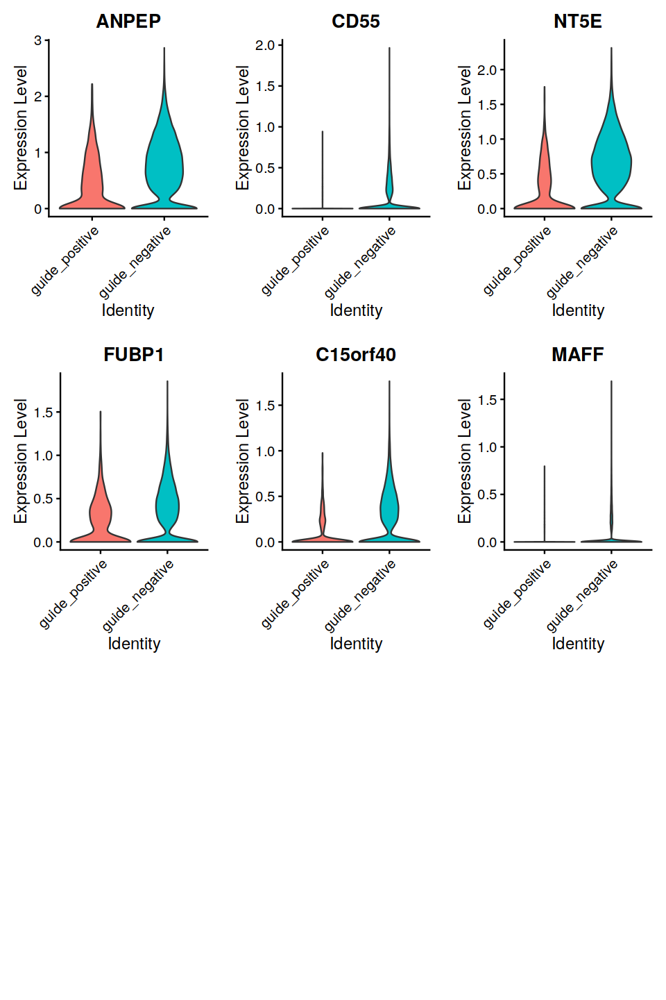

In [58]:
targets = unique(filter(df_guide, subclass=='tss')$alias)
plots = vlnplot_for_targets(seurat_rna, df_guide, perturbed_cells_by_guide, targets)
options(repr.plot.width=8, repr.plot.height=12)
ggarrange(plotlist=plots, ncol=3, nrow = 3)

## DE controls

[1] "FTH1"
Guide+ = 3962 ; Guide- = 17401 
[1] "PLIN3"
Guide+ = 2340 ; Guide- = 19023 
[1] "TKT"
Guide+ = 2237 ; Guide- = 19126 
[1] "LGALS3"
Guide+ = 2449 ; Guide- = 18914 
[1] "CSTB"
Guide+ = 2632 ; Guide- = 18731 
[1] "CTSB"
Guide+ = 2556 ; Guide- = 18807 
[1] "KLF6"
Guide+ = 2549 ; Guide- = 18814 


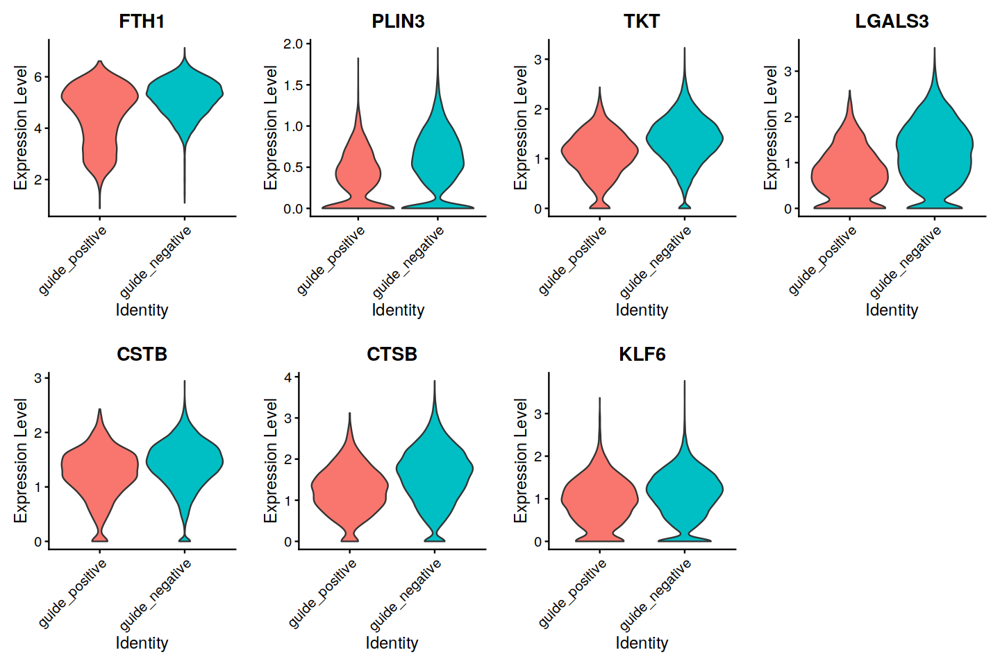

In [59]:
targets = unique(filter(df_guide, subclass=='de_control')$alias)
plots = vlnplot_for_targets(seurat_rna, df_guide, perturbed_cells_by_guide, targets)
options(repr.plot.width=12, repr.plot.height=8)
ggarrange(plotlist=plots, ncol=4, nrow = 2)

## CKD DE 

[1] "DE6"
Guide+ = 3211 ; Guide- = 18152 


Picking joint bandwidth of 0.0585

Picking joint bandwidth of 0.0743

Picking joint bandwidth of 0.095



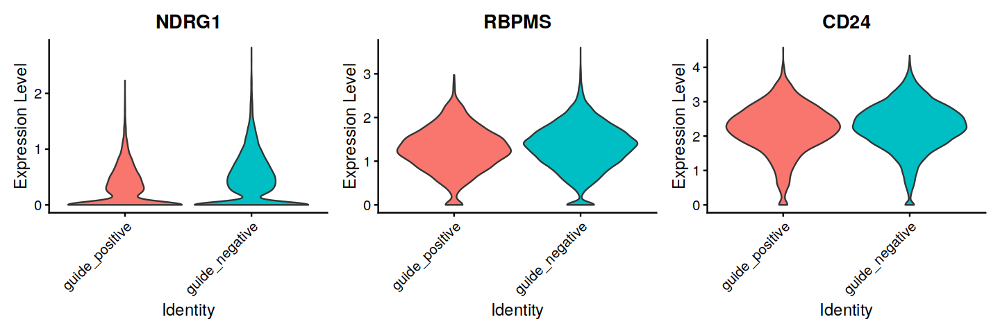

[1] "DE15"
Guide+ = 2658 ; Guide- = 18705 


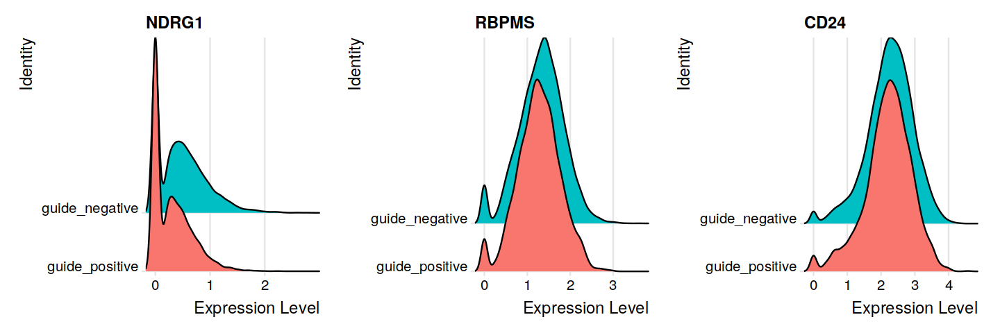

Picking joint bandwidth of 0.0659

Picking joint bandwidth of 0.0752

Picking joint bandwidth of 0.0994



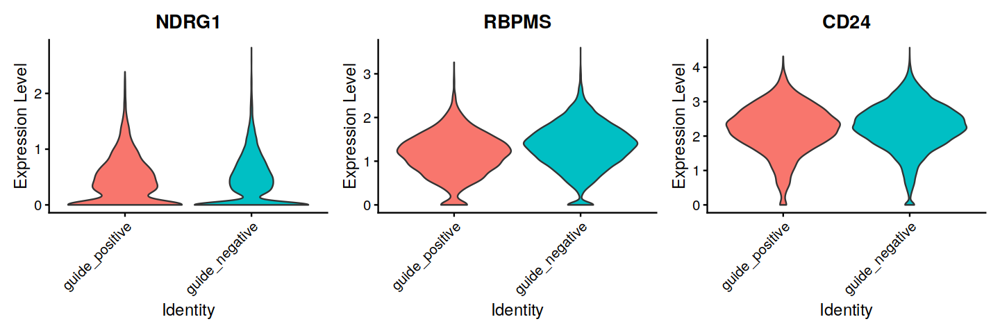

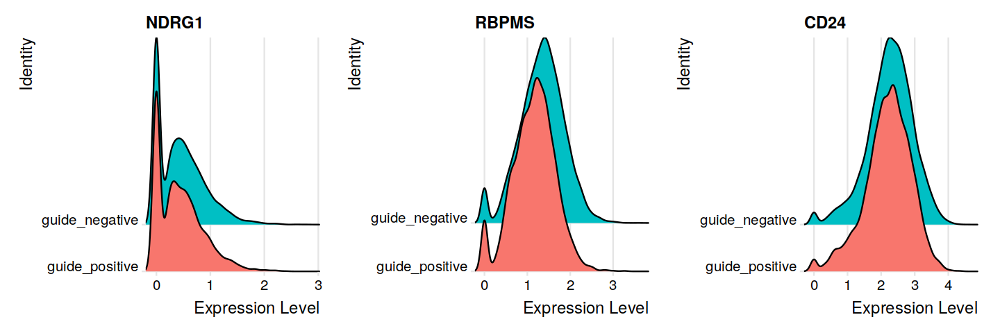

In [60]:
targets = c("DE6", "DE15")
regulated_genes = c("NDRG1", "RBPMS", "CD24")

for(i in seq_along(targets)) {
    target = targets[i]
    print(target)
    guides = get_guides_by_subclass(df_guide, 'alias', target)
    seurat_rna <- mark_guide_pos_neg(
        seurat_rna, 
        perturbed_cells_by_guide, 
        guides, 
        print_counts = T
    )

    options(repr.plot.width=6, repr.plot.height=4)
    plt <- VlnPlot(
        object = seurat_rna,
        features = regulated_genes, 
        idents = NULL, 
        pt.size = 0, 
        sort = F, 
        ncol = 3,    
    ) 

    options(repr.plot.width=12, repr.plot.height=4)
    plt2 <- RidgePlot(
        object = seurat_rna,
        features = regulated_genes, 
        idents = NULL,  
        sort = F, 
        ncol = 3,    
    ) 

    print(plt) 
    print(plt2)
}



# Check DE for genes near SNPs

In [62]:
select_distal  = df_guide$subclass == 'ckd_de'
df_snps = unique(df_guide[select_distal, c('gene','alias')])

In [63]:
snp_coords = ncbi_snp_query(df_snps$gene)

Getting info about the following rsIDs: rs2823139, rs7642977, rs78581838, rs7707989, rs527616, rs10283362, rs34861762, rs16874072, rs881858, rs4669722, rs76839935, rs6839100, rs11154336, rs4720089, rs2979488, rs2661503, rs10224210



In [64]:
snp_upstream_range   = 100000
snp_downstream_range = 100000

df_snp_coords                 = data.frame(chr=paste0("chr", snp_coords$chromosome))
df_snp_coords$start_position  = snp_coords$bp + snp_upstream_range
df_snp_coords$end_position    = snp_coords$bp + snp_downstream_range
df_snp_coords$strand          = '*'
df_snp_coords$hgnc_symbol     = snp_coords$rsid
df_snp_coords$chromosome_name = snp_coords$chromosome
#snp_granges = makeGRangesFromDataFrame(df_dummy)

In [65]:
ensembl <- useEnsembl(biomart = "genes", dataset = "hsapiens_gene_ensembl")
searchDatasets(mart = ensembl, pattern = "hsapiens")
mart <- useMart("ensembl")
mart <- useDataset("hsapiens_gene_ensembl", mart)

,dataset,description,version
,<I<chr>>,<I<chr>>,<I<chr>>
79,hsapiens_gene_ensembl,Human genes (GRCh38.p13),GRCh38.p13


# Find neighbors of targets

In [69]:
genes_in_assay = rownames(seurat_rna[['RNA']]@counts)
m <- useMart('ensembl', dataset='hsapiens_gene_ensembl') # create a mart object

In [70]:
source('/home/vsevim/prj/workflows/ckd/secondary/helper_functions_for_diffex.r')
control_targets = unique(filter(df_guide, subclass=='tss' | subclass == 'de_control')[,c('alias')])

df_target_coords <- getBM(mart=m, attributes=c('hgnc_symbol', 'description', 'chromosome_name',
                                 'start_position', 'end_position', 'strand',
                                 'ensembl_gene_id'),
                        filters = 'hgnc_symbol', values = control_targets)
                        
df_target_coords <- filter(df_target_coords, chromosome_name %in% c(1:23, "X","Y"))

In [71]:
gene_neighbors_list = get_neighboring_genes(bm, df_target_coords, genes_in_assay)
snp_neighbors_list  = get_neighboring_genes(bm, df_snp_coords, genes_in_assay)
neighbors_list =  append(gene_neighbors_list, snp_neighbors_list) 

ANPEP 15 88784895 90815401 
C15orf40 15 81988441 84011641 
CD55 1 206321519 208386804 
CSTB 21 42772511 44776330 
CTSB 8 10842524 12869533 
FTH1 11 60959718 62967634 
FUBP1 1 76944055 78979110 
KLF6 10 2775996 4785281 
LGALS3 14 54124110 56145423 
MAFF 22 37200767 39216507 
NT5E 6 84449584 86495791 
PLIN3 19 3838341 5867694 
TKT 3 52224712 54256052 
rs2823139 21 14304463 16304463 
rs7642977 3 193192961 195192961 
rs78581838 21 13964259 15964259 
rs7707989 5 67496052 69496052 
rs527616 18 25857460 27857460 
rs10283362 8 132420717 134420717 
rs34861762 8 22990907 24990907 
rs16874072 4 22841827 24841827 
rs881858 6 42938872 44938872 
rs4669722 2 10490110 12490110 
rs76839935 7 150970466 152970466 
rs6839100 4 75558036 77558036 
rs11154336 6 124999862 126999862 
rs4720089 7 32064026 34064026 
rs2979488 8 29523114 31523114 
rs2661503 6 50744819 52744819 
rs10224210 7 150816108 152816108 


In [72]:
list.save(neighbors_list, "/home/vsevim/prj/1012-ckd/S1/scripts/library_csv/neighbors_list.rds")


Attaching package: 'rlist'


The following object is masked from 'package:S4Vectors':

    List




## Run diffex on genes neighboring the snps w/ min_LFC = 0.10

In [74]:
df_targets = unique(filter(df_guide, subclass=='ckd_de')[,c('alias','gene','subclass', 'label')])
df_targets = unique(filter(df_guide, class=='targeting')[,c('alias','gene','subclass', 'label')])
df_neighbor_de = NULL
test_use = "LR" #"MAST"  #"wilcox" "LR"
guides_to_skip = c()  #c("DE6", "DE15")  

for(i in 1:nrow(df_targets)) {
    target          = df_targets[i,'alias']
    target_subclass = df_targets[i, 'subclass']
    label           = df_targets[i, 'label']
    snp_id_or_gene_name = df_targets[i,'gene']
    
    if(!str_detect(target, regex("^DE\\d+$"))) {
        ckd_de = 
        neigbors = neighbors_list[[target]]
    } else {
        neigbors = neighbors_list[[snp_id_or_gene_name]]
    }

    if((target %in% guides_to_skip) | length(neigbors) == 0 ){
        cat(red("Skipping", target, snp_id_or_gene_name, length(neigbors), "\n"))
        next
    }
    guides_4_target = get_guides_by_subclass(df_guide, 'alias', target)
    cat(blue(target, target,":"), paste(guides_4_target, collapse=","),"\n")
    seurat_dummy <- mark_guide_pos_neg(seurat_rna, perturbed_cells_by_guide, guides_4_target, print_counts = T)
    
    markers <- FindMarkers(
        object = seurat_dummy,
        features = neigbors,
        slot = "data",
        ident.1 = 'guide_positive',
        ident.2 = 'guide_negative',
        test.use = test_use,
        logfc.threshold = 0.01,
        latent.vars = c("library", "donor"),
        only.pos = FALSE, 
        verbose = FALSE
    )
    # 
    # latent.vars = c('library') 
    if(nrow(markers)==0) {
        cat(red("No DE genes", test_use,":", target, "\n"))
        next
    } 
    markers$de_gene = rownames(markers)
    markers$target = target
    markers$subclass = target_subclass
    markers$label = label
    rownames(markers) <- NULL
    df_neighbor_de = rbind(df_neighbor_de, markers)
    print(markers)
}

ANPEP ANPEP : CD13-1a,CD13-1b 
Guide+ = 1378 ; Guide- = 19985 
      p_val avg_log2FC pct.1 pct.2 p_val_adj   de_gene target subclass
1  4.7e-118     -0.508  0.57 0.804  1.7e-113     ANPEP  ANPEP      tss
2   6.0e-07      0.058  0.71 0.619   2.2e-02     AP3S2  ANPEP      tss
3   2.9e-05     -0.075  0.82 0.827   1.0e+00      IDH2  ANPEP      tss
4   3.9e-05      0.031  0.34 0.256   1.0e+00     MESP1  ANPEP      tss
5   5.5e-05      0.051  0.65 0.568   1.0e+00     MFGE8  ANPEP      tss
6   4.6e-04      0.047  0.85 0.828   1.0e+00      NGRN  ANPEP      tss
7   5.5e-03     -0.067  0.84 0.818   1.0e+00    SEMA4B  ANPEP      tss
8   3.2e-02      0.015  0.32 0.262   1.0e+00     ARPIN  ANPEP      tss
9   5.0e-02      0.027  0.95 0.952   1.0e+00    IQGAP1  ANPEP      tss
10  6.0e-02      0.011  0.12 0.092   1.0e+00 CRTC3-AS1  ANPEP      tss
11  1.1e-01     -0.019  0.19 0.180   1.0e+00     FANCI  ANPEP      tss
12  1.9e-01     -0.011  0.17 0.165   1.0e+00    PEX11A  ANPEP      tss
13  3.1e-01   

In [75]:
#rownames(df_neighbor_de) <- df_neighbor_de$de_gene
head(df_neighbor_de)

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,de_gene,target,subclass,label
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>
1,4.7e-118,-0.508,0.57,0.80,1.7e-113,ANPEP,ANPEP,tss,Control TSS
2,6.0e-07,0.058,0.71,0.62,2.2e-02,AP3S2,ANPEP,tss,Control TSS
3,2.9e-05,-0.075,0.82,0.83,1.0e+00,IDH2,ANPEP,tss,Control TSS
4,3.9e-05,0.031,0.34,0.26,1.0e+00,MESP1,ANPEP,tss,Control TSS
5,5.5e-05,0.051,0.65,0.57,1.0e+00,MFGE8,ANPEP,tss,Control TSS
6,4.6e-04,0.047,0.85,0.83,1.0e+00,NGRN,ANPEP,tss,Control TSS


## Volcano Plot

In [76]:
colors <- ifelse(
    df_neighbor_de$subclass == 'tss', 'black',
    ifelse(df_neighbor_de$subclass == 'de_control', 'gray', 'green') 
)
names(colors) <- df_neighbor_de$label

Warning message:
"One or more p-values is 0. Converting to 10^-1 * current lowest non-zero p-value..."
Scale for x is already present.
Adding another scale for x, which will replace the existing scale.


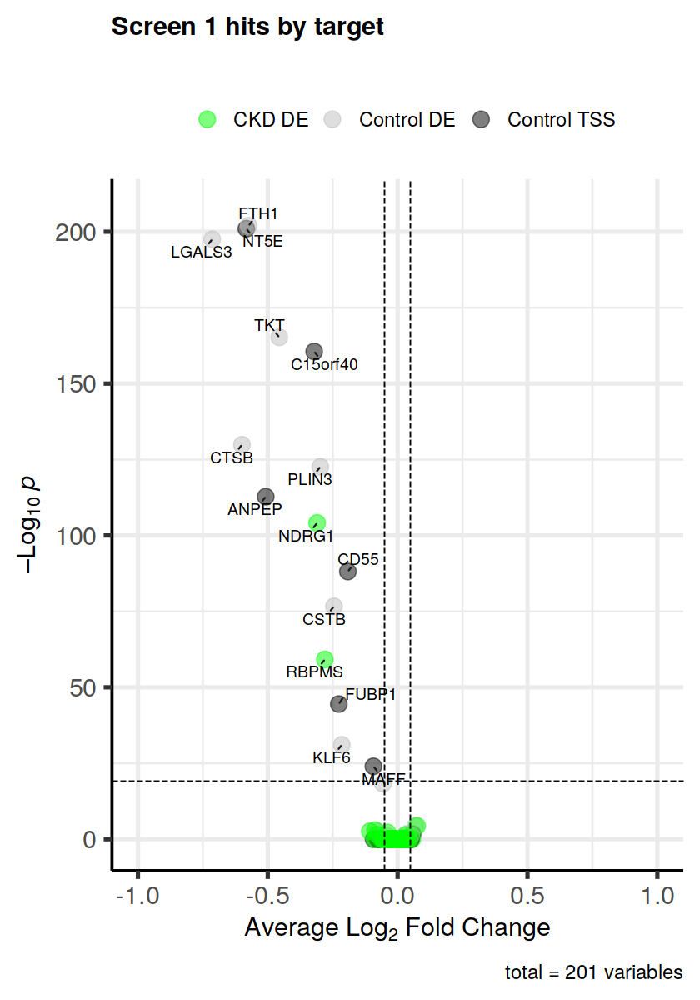

In [77]:
options(repr.plot.width = 7, repr.plot.height = 10)
EnhancedVolcano(df_neighbor_de, 
                lab = df_neighbor_de$de_gene,
                x ="avg_log2FC",
                y ="p_val_adj",
                title = 'Screen 1 hits by target',
                subtitle = '', 
                colCustom = colors,
                drawConnectors = TRUE,
                arrowheads = FALSE,
                pCutoff = 10e-20,
                FCcutoff = 0.05,
                pointSize = 5.0,
                labSize = 4.0
                ) +
                xlim(-1, 1) +
                xlab(expression(paste("Average ", Log[2], " Fold Change"))) +
                ylab(expression(paste("\u2013", Log[10], " ", italic(p))))
                

# lab = df_neighbor_de$de_gene,
# drawConnectors = TRUE,

In [78]:
head(df_neighbor_de, 20)

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,de_gene,target,subclass,label
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>
1,4.7e-118,-0.508,0.57,0.804,1.7e-113,ANPEP,ANPEP,tss,Control TSS
2,6.0e-07,0.058,0.71,0.619,2.2e-02,AP3S2,ANPEP,tss,Control TSS
3,2.9e-05,-0.075,0.82,0.827,1.0e+00,IDH2,ANPEP,tss,Control TSS
4,3.9e-05,0.031,0.34,0.256,1.0e+00,MESP1,ANPEP,tss,Control TSS
5,5.5e-05,0.051,0.65,0.568,1.0e+00,MFGE8,ANPEP,tss,Control TSS
6,4.6e-04,0.047,0.85,0.828,1.0e+00,NGRN,ANPEP,tss,Control TSS
7,5.5e-03,-0.067,0.84,0.818,1.0e+00,SEMA4B,ANPEP,tss,Control TSS
8,3.2e-02,0.015,0.32,0.262,1.0e+00,ARPIN,ANPEP,tss,Control TSS
9,5.0e-02,0.027,0.95,0.952,1.0e+00,IQGAP1,ANPEP,tss,Control TSS


# Run Diffex using LR instead of MAST

In [79]:
targets = unique(filter(df_guide, class=='targeting')$alias)
df_de = NULL
genes_to_skip = c("DE5", "CD55", "CSTB")
genes_to_skip = c()

for(target in targets){
    if(target %in% genes_to_skip){
        cat(red("Skipping", target, "\n"))
        next
    }
    guides_4_target = get_guides_by_subclass(df_guide, 'alias', target)
    cat(blue(target,":"), paste(guides_4_target, collapse=","),"\n")
    seurat_dummy <- mark_guide_pos_neg(seurat_rna, perturbed_cells_by_guide, guides_4_target, print_counts = T)
    
    markers <- FindMarkers(
        object = seurat_dummy,
        slot = "data",
        ident.1 = 'guide_positive',
        ident.2 = 'guide_negative',
        test.use = "LR",
        latent.vars = c("library", "donor"),
        logfc.threshold = 0.25,
        verbose = FALSE
    )
    # latent.vars = c('library') 
    if(nrow(markers)==0) {
        cat(Red("No DE genes", target,  "\n"))
    }
    markers$de_gene = rownames(markers)
    markers$target = target
    rownames(markers) <- NULL
    df_de = rbind(df_de, markers)
}

ANPEP : CD13-1a,CD13-1b 
Guide+ = 1378 ; Guide- = 19985 
CD55 : CD55-1a,CD55-1b 
Guide+ = 1295 ; Guide- = 20068 
NT5E : CD73-1a,CD73-1b 
Guide+ = 1194 ; Guide- = 20169 
FUBP1 : FUBP1-1a,FUBP1-1b 
Guide+ = 1049 ; Guide- = 20314 
C15orf40 : C15orf40-1a,C15orf40-1b 
Guide+ = 1278 ; Guide- = 20085 
MAFF : MAFF-1a,MAFF-1b 
Guide+ = 1038 ; Guide- = 20325 
FTH1 : FTH1-1a,FTH1-2a,FTH1-1b,FTH1-2b 
Guide+ = 3962 ; Guide- = 17401 
PLIN3 : PLIN3-1a,PLIN3-2a,PLIN3-1b,PLIN3-2b 
Guide+ = 2340 ; Guide- = 19023 
TKT : TKT-1a,TKT-2a,TKT-1b,TKT-2b 
Guide+ = 2237 ; Guide- = 19126 
LGALS3 : LGALS3-1a,LGALS3-2a,LGALS3-1b,LGALS3-2b 
Guide+ = 2449 ; Guide- = 18914 
CSTB : CSTB-1a,CSTB-2a,CSTB-1b,CSTB-2b 
Guide+ = 2632 ; Guide- = 18731 
CTSB : CTSB-1a,CTSB-2a,CTSB-1b,CTSB-2b 
Guide+ = 2556 ; Guide- = 18807 
KLF6 : KLF6-1a,KLF6-2a,KLF6-1b,KLF6-2b 
Guide+ = 2549 ; Guide- = 18814 
DE1 : DE1-1a,DE1-2a,DE1-1b,DE1-2b 
Guide+ = 2543 ; Guide- = 18820 
DE2 : DE2-1a,DE2-2a,DE2-1b,DE2-2b 
Guide+ = 1413 ; Guide- = 19950 


In [80]:
df_de

p_val,avg_log2FC,pct.1,pct.2,p_val_adj,de_gene,target
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
4.7e-118,-0.51,0.57,0.80,1.7e-113,ANPEP,ANPEP
2.0e-35,0.33,1.00,0.99,7.3e-31,SQSTM1,ANPEP
8.4e-26,0.41,0.79,0.70,3.1e-21,HMOX1,ANPEP
3.1e-18,0.25,0.95,0.90,1.1e-13,MDM2,ANPEP
8.9e-18,0.36,0.32,0.20,3.3e-13,AL357507.1,ANPEP
1.5e-13,0.27,0.56,0.45,5.6e-09,AL138828.1,ANPEP
2.0e-12,0.29,0.94,0.92,7.4e-08,PLIN2,ANPEP
7.7e-12,0.43,0.53,0.45,2.8e-07,IFI27,ANPEP
1.4e-08,-0.27,0.73,0.76,5.2e-04,KRT19,ANPEP


In [81]:
targets = unique(df_de$target)

for(t in targets){
    print(filter(df_de, target == t) %>% head(3))
    cat(yellow("------------------------------------------------------------\n\n\n"))

}

     p_val avg_log2FC pct.1 pct.2 p_val_adj de_gene target
1 4.7e-118      -0.51  0.57  0.80  1.7e-113   ANPEP  ANPEP
2  2.0e-35       0.33  1.00  0.99   7.3e-31  SQSTM1  ANPEP
3  8.4e-26       0.41  0.79  0.70   3.1e-21   HMOX1  ANPEP
------------------------------------------------------------


    p_val avg_log2FC pct.1 pct.2 p_val_adj de_gene target
1 2.4e-20       0.40  0.78  0.70   8.8e-16   HMOX1   CD55
2 6.4e-04      -0.26  0.50  0.49   1.0e+00  KCNIP4   CD55
------------------------------------------------------------


     p_val avg_log2FC pct.1 pct.2 p_val_adj de_gene target
1 2.8e-206      -0.58  0.46  0.82  1.0e-201    NT5E   NT5E
2  1.6e-20       0.48  0.77  0.70   6.0e-16   HMOX1   NT5E
3  4.3e-16       0.26  1.00  0.99   1.6e-11  SQSTM1   NT5E
------------------------------------------------------------


    p_val avg_log2FC pct.1 pct.2 p_val_adj de_gene target
1 5.5e-34      -0.43  1.00  1.00   2.0e-29   NEAT1  FUBP1
2 2.0e-25       0.42  0.81  0.70   7.3e-21   HMOX

# Does the control set have always higher expression regardless the gene?

[1] "DE6"
Guide+ = 3211 ; Guide- = 18152 
[1] "DE15"
Guide+ = 2658 ; Guide- = 18705 


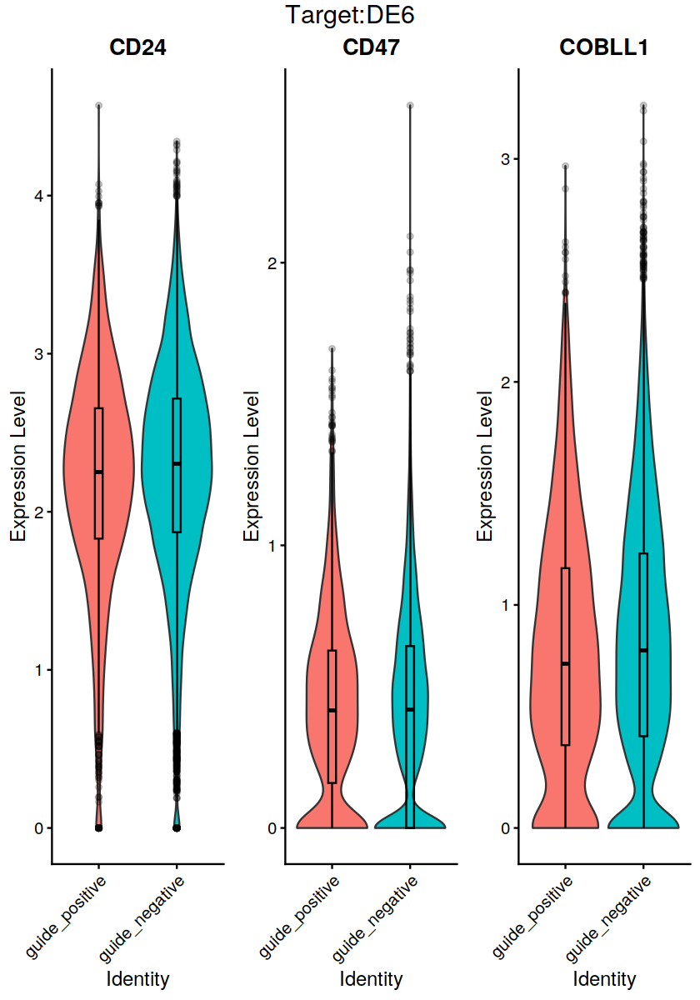

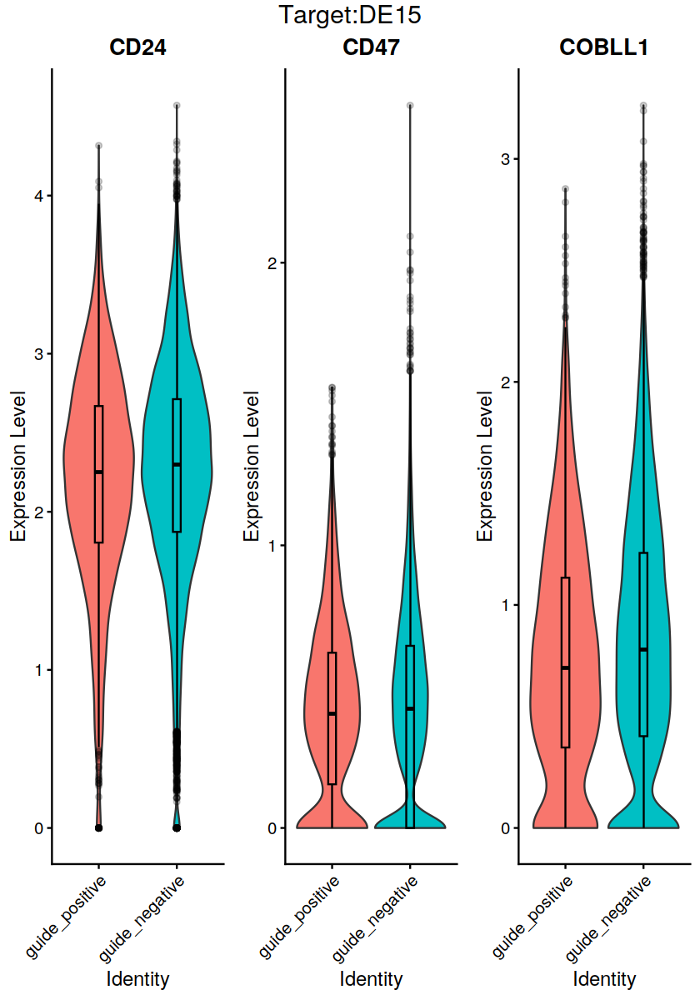

In [82]:
targets = c("DE6", "DE15")
regulated_genes = c("CD24", "CD47", "COBLL1")


for(i in seq_along(targets)) {
    target = targets[i]
    print(target)
    guides = get_guides_by_subclass(df_guide, 'alias', target)
    seurat_rna <- mark_guide_pos_neg(
        seurat_rna, 
        perturbed_cells_by_guide, 
        guides, 
        print_counts = T
    )

    plots <- VlnPlot(
                    object = seurat_rna,
                    features = regulated_genes, 
                    idents = NULL, 
                    pt.size = 0, 
                    sort = F, 
                    ncol = 3,  
                    combine = F  
        ) 

    for(i in 1:length(plots)) {
        plots[[i]] <- plots[[i]] + 
        NoLegend() +
        geom_boxplot(width=0.1, color="black", alpha=0.2)
    }

    title = paste0("Target:", target)
    plt1 <- ggarrange(plotlist=plots, ncol=3, nrow = 1) 
    plt1 <- annotate_figure(plt1, top = text_grob(title, color = "black", size = 18))  

    print(plt1) 
}



# Debug

In [83]:
df_neighbor_de

p_val,avg_log2FC,pct.1,pct.2,p_val_adj,de_gene,target,subclass,label
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>
4.7e-118,-0.508,0.57,0.804,1.7e-113,ANPEP,ANPEP,tss,Control TSS
6.0e-07,0.058,0.71,0.619,2.2e-02,AP3S2,ANPEP,tss,Control TSS
2.9e-05,-0.075,0.82,0.827,1.0e+00,IDH2,ANPEP,tss,Control TSS
3.9e-05,0.031,0.34,0.256,1.0e+00,MESP1,ANPEP,tss,Control TSS
5.5e-05,0.051,0.65,0.568,1.0e+00,MFGE8,ANPEP,tss,Control TSS
4.6e-04,0.047,0.85,0.828,1.0e+00,NGRN,ANPEP,tss,Control TSS
5.5e-03,-0.067,0.84,0.818,1.0e+00,SEMA4B,ANPEP,tss,Control TSS
3.2e-02,0.015,0.32,0.262,1.0e+00,ARPIN,ANPEP,tss,Control TSS
5.0e-02,0.027,0.95,0.952,1.0e+00,IQGAP1,ANPEP,tss,Control TSS
